## Project 5: Face Generation
##### Lekhraj Sharma, Udacity's Nanodegree Deep Learning Foundation, May 2017

# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

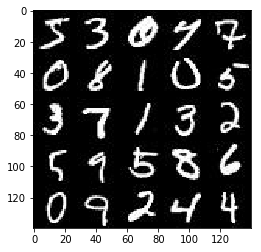

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

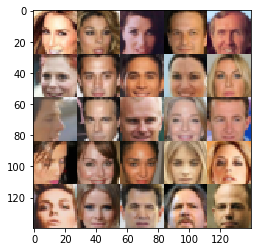

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    inputs_lr = tf.placeholder(tf.float32, name='input_lr')
    
    return inputs_real, inputs_z, inputs_lr

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def LeakyReLU(h, alpha):
    return tf.maximum(alpha * h, h)

def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Layer 1: Input layer is 28x28x3 or 28x28x1
        h1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same')
        h1 = LeakyReLU(h1, alpha)

        # Layer 2: Input is 14x14x128
        h2 = tf.layers.conv2d(h1, 128, 5, strides=1, padding='same')
        h2 = tf.layers.batch_normalization(h2, training=True)                 
        h2 = LeakyReLU(h2, alpha)
        
        # Layer 3: Input is 14x14x128
        h3 = tf.layers.conv2d(h2, 256, 5, strides=2, padding='same')
        h3 = tf.layers.batch_normalization(h3, training=True)                 
        h3 = LeakyReLU(h3, alpha)

                        
        # Final Layer: Input is 7x7x256
        h3_flat = tf.reshape(h3, (-1, 7*7*256))
        logits = tf.layers.dense(h3_flat, 1, activation=None)
        out = tf.sigmoid(logits)
        
        return out, logits    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.01):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected Hidden layer: output 7x7x256
        x1 = tf.layers.dense(z, 7*7*256, use_bias=False, activation=None)
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)         
        x1 = LeakyReLU(x1, alpha)

        # First conv Hidden layer: output 14x14x128
        h1 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='same')
        h1 = tf.layers.batch_normalization(h1, training=is_train)         
        h1 = LeakyReLU(h1, alpha)
        
        # Second conv Hidden layer: output 14x14x128
        h2 = tf.layers.conv2d_transpose(h1, 128, 5, strides=1, padding='same')
        h2 = tf.layers.batch_normalization(h2, training=is_train)         
        h2 = LeakyReLU(h2, alpha)


        # Output layer: output 28x28xout_channel_dim
        logits =tf.layers.conv2d_transpose(h2, out_channel_dim, 5, strides=2, padding='same')       
        out = tf.tanh(logits)
        
        return out    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.01):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss        

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]

    # Optimize
    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    :return: losses (discriminator and generator)
    """
    # TODO: Build Model
    
    input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha=0.25)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)    

    sample_z = np.random.uniform(-1, 1, size=(50, z_dim))

    losses = []
    steps = 0
    print_every = 10
    show_every = 100
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Scale the input image (-0.5 to 0.5) to -1 to 1 range
                batch_images = batch_images * 2 

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, show_n_images, input_z, data_shape[3], data_image_mode)
                    
    return losses      

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.6596... Generator Loss: 1.0114
Epoch 1/2... Discriminator Loss: 1.7886... Generator Loss: 0.2305
Epoch 1/2... Discriminator Loss: 1.0220... Generator Loss: 0.5590
Epoch 1/2... Discriminator Loss: 0.6131... Generator Loss: 1.0078
Epoch 1/2... Discriminator Loss: 0.5178... Generator Loss: 1.7461
Epoch 1/2... Discriminator Loss: 1.0232... Generator Loss: 0.5915
Epoch 1/2... Discriminator Loss: 0.8887... Generator Loss: 0.6728
Epoch 1/2... Discriminator Loss: 1.0630... Generator Loss: 0.5631
Epoch 1/2... Discriminator Loss: 0.9003... Generator Loss: 0.7025
Epoch 1/2... Discriminator Loss: 0.6541... Generator Loss: 1.1582


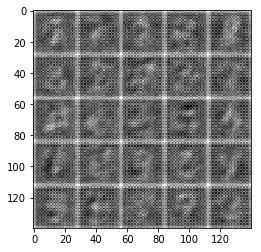

Epoch 1/2... Discriminator Loss: 1.5825... Generator Loss: 0.3153
Epoch 1/2... Discriminator Loss: 0.8780... Generator Loss: 0.7033
Epoch 1/2... Discriminator Loss: 1.0404... Generator Loss: 0.5476
Epoch 1/2... Discriminator Loss: 0.7682... Generator Loss: 0.8805
Epoch 1/2... Discriminator Loss: 1.1849... Generator Loss: 0.4525
Epoch 1/2... Discriminator Loss: 1.3435... Generator Loss: 0.3738
Epoch 1/2... Discriminator Loss: 0.9831... Generator Loss: 0.5923
Epoch 1/2... Discriminator Loss: 0.8520... Generator Loss: 0.7218
Epoch 1/2... Discriminator Loss: 0.6353... Generator Loss: 1.0005
Epoch 1/2... Discriminator Loss: 0.7577... Generator Loss: 0.8272


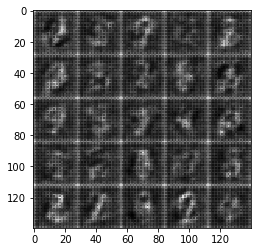

Epoch 1/2... Discriminator Loss: 1.4161... Generator Loss: 0.3519
Epoch 1/2... Discriminator Loss: 0.6334... Generator Loss: 1.1245
Epoch 1/2... Discriminator Loss: 1.1096... Generator Loss: 0.4972
Epoch 1/2... Discriminator Loss: 0.6229... Generator Loss: 1.0524
Epoch 1/2... Discriminator Loss: 0.7838... Generator Loss: 2.4867
Epoch 1/2... Discriminator Loss: 0.7039... Generator Loss: 2.2624
Epoch 1/2... Discriminator Loss: 0.4730... Generator Loss: 1.7552
Epoch 1/2... Discriminator Loss: 0.5996... Generator Loss: 2.1468
Epoch 1/2... Discriminator Loss: 0.7052... Generator Loss: 2.3648
Epoch 1/2... Discriminator Loss: 0.5220... Generator Loss: 1.3670


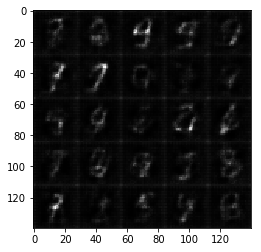

Epoch 1/2... Discriminator Loss: 0.6301... Generator Loss: 1.0060
Epoch 1/2... Discriminator Loss: 0.6364... Generator Loss: 0.9695
Epoch 1/2... Discriminator Loss: 0.5719... Generator Loss: 1.1971
Epoch 1/2... Discriminator Loss: 1.2503... Generator Loss: 3.4388
Epoch 1/2... Discriminator Loss: 0.5810... Generator Loss: 2.3173
Epoch 1/2... Discriminator Loss: 0.6533... Generator Loss: 0.9642
Epoch 1/2... Discriminator Loss: 0.4980... Generator Loss: 1.9456
Epoch 1/2... Discriminator Loss: 0.4864... Generator Loss: 1.8563
Epoch 1/2... Discriminator Loss: 0.6913... Generator Loss: 0.9824
Epoch 1/2... Discriminator Loss: 0.7499... Generator Loss: 0.8278


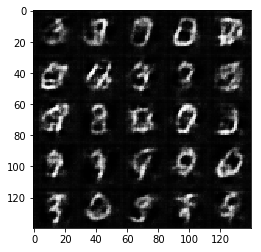

Epoch 1/2... Discriminator Loss: 0.6631... Generator Loss: 2.4062
Epoch 1/2... Discriminator Loss: 0.7414... Generator Loss: 0.8228
Epoch 1/2... Discriminator Loss: 0.6120... Generator Loss: 1.0441
Epoch 1/2... Discriminator Loss: 2.1381... Generator Loss: 0.1689
Epoch 1/2... Discriminator Loss: 0.5481... Generator Loss: 1.9427
Epoch 1/2... Discriminator Loss: 0.5453... Generator Loss: 1.2606
Epoch 2/2... Discriminator Loss: 0.7745... Generator Loss: 2.2870
Epoch 2/2... Discriminator Loss: 0.5528... Generator Loss: 1.2431
Epoch 2/2... Discriminator Loss: 0.5658... Generator Loss: 1.4386
Epoch 2/2... Discriminator Loss: 0.5903... Generator Loss: 1.8576


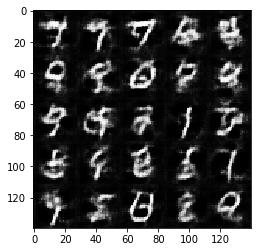

Epoch 2/2... Discriminator Loss: 0.4843... Generator Loss: 1.4507
Epoch 2/2... Discriminator Loss: 0.8353... Generator Loss: 0.7737
Epoch 2/2... Discriminator Loss: 0.6153... Generator Loss: 1.1734
Epoch 2/2... Discriminator Loss: 1.0126... Generator Loss: 0.5955
Epoch 2/2... Discriminator Loss: 1.1192... Generator Loss: 0.5455
Epoch 2/2... Discriminator Loss: 0.6576... Generator Loss: 1.0610
Epoch 2/2... Discriminator Loss: 0.5428... Generator Loss: 1.4797
Epoch 2/2... Discriminator Loss: 0.7296... Generator Loss: 2.2792
Epoch 2/2... Discriminator Loss: 0.7860... Generator Loss: 1.0339
Epoch 2/2... Discriminator Loss: 2.2084... Generator Loss: 0.1435


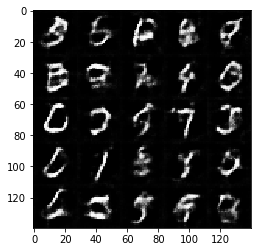

Epoch 2/2... Discriminator Loss: 0.7752... Generator Loss: 0.9548
Epoch 2/2... Discriminator Loss: 0.4885... Generator Loss: 1.4378
Epoch 2/2... Discriminator Loss: 0.9171... Generator Loss: 0.6845
Epoch 2/2... Discriminator Loss: 0.6306... Generator Loss: 1.5726
Epoch 2/2... Discriminator Loss: 0.6220... Generator Loss: 1.4857
Epoch 2/2... Discriminator Loss: 0.7565... Generator Loss: 0.9573
Epoch 2/2... Discriminator Loss: 0.7958... Generator Loss: 0.8720
Epoch 2/2... Discriminator Loss: 0.8076... Generator Loss: 0.8791
Epoch 2/2... Discriminator Loss: 0.5368... Generator Loss: 1.5248
Epoch 2/2... Discriminator Loss: 2.6299... Generator Loss: 0.1157


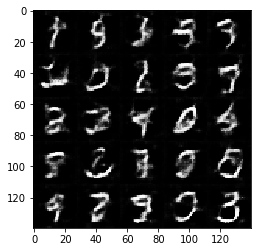

Epoch 2/2... Discriminator Loss: 0.7430... Generator Loss: 0.9464
Epoch 2/2... Discriminator Loss: 0.6625... Generator Loss: 1.2690
Epoch 2/2... Discriminator Loss: 0.7113... Generator Loss: 1.2175
Epoch 2/2... Discriminator Loss: 0.6173... Generator Loss: 1.1633
Epoch 2/2... Discriminator Loss: 0.6125... Generator Loss: 1.1909
Epoch 2/2... Discriminator Loss: 0.6021... Generator Loss: 1.3463
Epoch 2/2... Discriminator Loss: 0.5993... Generator Loss: 1.9936
Epoch 2/2... Discriminator Loss: 0.6400... Generator Loss: 1.5191
Epoch 2/2... Discriminator Loss: 0.9663... Generator Loss: 0.6179
Epoch 2/2... Discriminator Loss: 1.5759... Generator Loss: 0.3307


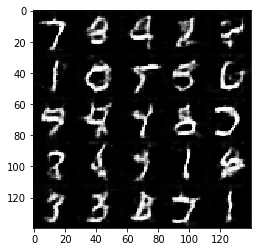

Epoch 2/2... Discriminator Loss: 0.6794... Generator Loss: 1.0121
Epoch 2/2... Discriminator Loss: 0.5873... Generator Loss: 1.4261
Epoch 2/2... Discriminator Loss: 0.5893... Generator Loss: 1.1293
Epoch 2/2... Discriminator Loss: 0.5569... Generator Loss: 1.2472
Epoch 2/2... Discriminator Loss: 0.8175... Generator Loss: 0.7890
Epoch 2/2... Discriminator Loss: 0.7015... Generator Loss: 0.9548
Epoch 2/2... Discriminator Loss: 0.6992... Generator Loss: 1.0493
Epoch 2/2... Discriminator Loss: 0.9265... Generator Loss: 2.3240
Epoch 2/2... Discriminator Loss: 0.5469... Generator Loss: 1.3517
Epoch 2/2... Discriminator Loss: 1.5799... Generator Loss: 0.3311


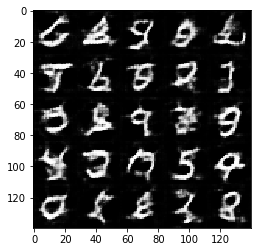

Epoch 2/2... Discriminator Loss: 1.4402... Generator Loss: 0.3563
Epoch 2/2... Discriminator Loss: 0.7633... Generator Loss: 1.3934
Epoch 2/2... Discriminator Loss: 0.7320... Generator Loss: 0.8851


In [19]:
batch_size = 128
z_dim = 200
learning_rate = 0.0001
beta1 = 0.25


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2 

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Discriminator Loss: 0.4630... Generator Loss: 1.3562
Epoch 1/10... Discriminator Loss: 0.2687... Generator Loss: 1.9020
Epoch 1/10... Discriminator Loss: 0.1614... Generator Loss: 2.4280
Epoch 1/10... Discriminator Loss: 0.1094... Generator Loss: 3.0461
Epoch 1/10... Discriminator Loss: 0.1396... Generator Loss: 3.3612
Epoch 1/10... Discriminator Loss: 0.8681... Generator Loss: 0.8176
Epoch 1/10... Discriminator Loss: 0.3475... Generator Loss: 2.6315
Epoch 1/10... Discriminator Loss: 0.4059... Generator Loss: 2.8594
Epoch 1/10... Discriminator Loss: 0.5040... Generator Loss: 2.4505
Epoch 1/10... Discriminator Loss: 1.3796... Generator Loss: 0.4514


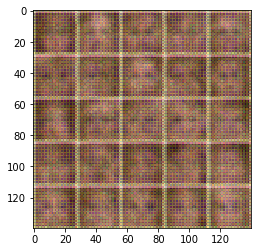

Epoch 1/10... Discriminator Loss: 1.0421... Generator Loss: 0.6127
Epoch 1/10... Discriminator Loss: 1.5251... Generator Loss: 0.3321
Epoch 1/10... Discriminator Loss: 0.4804... Generator Loss: 1.7854
Epoch 1/10... Discriminator Loss: 0.5639... Generator Loss: 2.5629
Epoch 1/10... Discriminator Loss: 0.4983... Generator Loss: 1.4651
Epoch 1/10... Discriminator Loss: 0.6994... Generator Loss: 1.0993
Epoch 1/10... Discriminator Loss: 0.4763... Generator Loss: 1.3220
Epoch 1/10... Discriminator Loss: 1.0338... Generator Loss: 0.6125
Epoch 1/10... Discriminator Loss: 1.0062... Generator Loss: 0.6014
Epoch 1/10... Discriminator Loss: 0.9401... Generator Loss: 0.7184


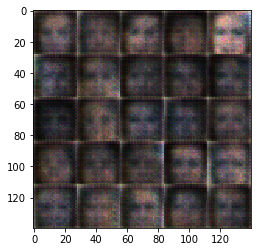

Epoch 1/10... Discriminator Loss: 1.0724... Generator Loss: 0.5913
Epoch 1/10... Discriminator Loss: 1.1020... Generator Loss: 0.5191
Epoch 1/10... Discriminator Loss: 0.3595... Generator Loss: 2.5989
Epoch 1/10... Discriminator Loss: 0.3217... Generator Loss: 2.8293
Epoch 1/10... Discriminator Loss: 1.0631... Generator Loss: 2.6589
Epoch 1/10... Discriminator Loss: 0.4926... Generator Loss: 1.2621
Epoch 1/10... Discriminator Loss: 0.9022... Generator Loss: 0.7656
Epoch 1/10... Discriminator Loss: 0.3181... Generator Loss: 1.7652
Epoch 1/10... Discriminator Loss: 1.9451... Generator Loss: 0.2073
Epoch 1/10... Discriminator Loss: 0.3339... Generator Loss: 2.0827


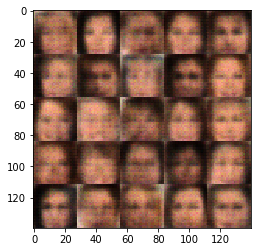

Epoch 1/10... Discriminator Loss: 0.3986... Generator Loss: 1.6633
Epoch 1/10... Discriminator Loss: 0.5063... Generator Loss: 1.2761
Epoch 1/10... Discriminator Loss: 0.7734... Generator Loss: 0.8787
Epoch 1/10... Discriminator Loss: 0.4572... Generator Loss: 1.4273
Epoch 1/10... Discriminator Loss: 0.7552... Generator Loss: 0.8515
Epoch 1/10... Discriminator Loss: 1.9647... Generator Loss: 0.2490
Epoch 1/10... Discriminator Loss: 0.5624... Generator Loss: 1.1758
Epoch 1/10... Discriminator Loss: 0.9884... Generator Loss: 0.6698
Epoch 1/10... Discriminator Loss: 0.5841... Generator Loss: 1.1344
Epoch 1/10... Discriminator Loss: 0.2657... Generator Loss: 2.4469


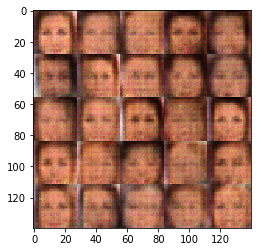

Epoch 1/10... Discriminator Loss: 0.1304... Generator Loss: 2.9917
Epoch 1/10... Discriminator Loss: 0.2378... Generator Loss: 3.1876
Epoch 1/10... Discriminator Loss: 0.4498... Generator Loss: 1.4887
Epoch 1/10... Discriminator Loss: 0.5931... Generator Loss: 1.1104
Epoch 1/10... Discriminator Loss: 0.5116... Generator Loss: 2.5176
Epoch 1/10... Discriminator Loss: 0.4396... Generator Loss: 1.3693
Epoch 1/10... Discriminator Loss: 0.9694... Generator Loss: 7.7470
Epoch 1/10... Discriminator Loss: 0.4531... Generator Loss: 1.4651
Epoch 1/10... Discriminator Loss: 0.2646... Generator Loss: 4.0506
Epoch 1/10... Discriminator Loss: 0.3935... Generator Loss: 5.4607


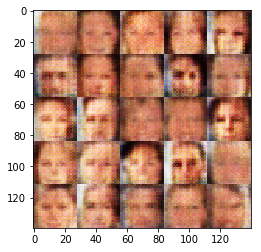

Epoch 1/10... Discriminator Loss: 1.0706... Generator Loss: 0.6141
Epoch 1/10... Discriminator Loss: 0.5049... Generator Loss: 1.2530
Epoch 1/10... Discriminator Loss: 0.4234... Generator Loss: 1.2756
Epoch 1/10... Discriminator Loss: 0.4449... Generator Loss: 4.8211
Epoch 1/10... Discriminator Loss: 0.7478... Generator Loss: 4.2909
Epoch 1/10... Discriminator Loss: 0.6202... Generator Loss: 6.2931
Epoch 1/10... Discriminator Loss: 1.4499... Generator Loss: 0.3601
Epoch 1/10... Discriminator Loss: 0.4027... Generator Loss: 1.5618
Epoch 1/10... Discriminator Loss: 1.4874... Generator Loss: 5.6802
Epoch 1/10... Discriminator Loss: 0.2283... Generator Loss: 2.0794


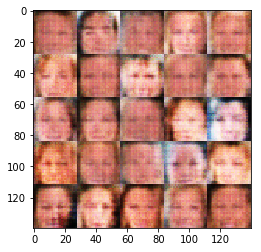

Epoch 1/10... Discriminator Loss: 0.1759... Generator Loss: 4.5444
Epoch 1/10... Discriminator Loss: 0.0905... Generator Loss: 3.7648
Epoch 1/10... Discriminator Loss: 0.8474... Generator Loss: 0.6951
Epoch 1/10... Discriminator Loss: 0.0647... Generator Loss: 5.6390
Epoch 1/10... Discriminator Loss: 0.1012... Generator Loss: 6.9422
Epoch 1/10... Discriminator Loss: 0.0437... Generator Loss: 4.9845
Epoch 1/10... Discriminator Loss: 1.6803... Generator Loss: 0.2519
Epoch 1/10... Discriminator Loss: 1.2926... Generator Loss: 6.1286
Epoch 1/10... Discriminator Loss: 0.1864... Generator Loss: 2.3826
Epoch 1/10... Discriminator Loss: 0.4086... Generator Loss: 1.2866


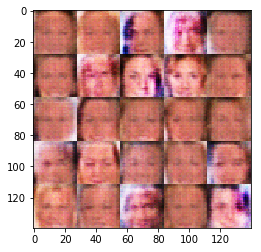

Epoch 1/10... Discriminator Loss: 0.6377... Generator Loss: 0.9163
Epoch 1/10... Discriminator Loss: 0.1416... Generator Loss: 2.7055
Epoch 1/10... Discriminator Loss: 0.5145... Generator Loss: 1.0856
Epoch 1/10... Discriminator Loss: 0.1097... Generator Loss: 2.7409
Epoch 1/10... Discriminator Loss: 0.7194... Generator Loss: 0.8054
Epoch 1/10... Discriminator Loss: 2.0826... Generator Loss: 0.1768
Epoch 1/10... Discriminator Loss: 1.9618... Generator Loss: 7.0320
Epoch 1/10... Discriminator Loss: 0.1236... Generator Loss: 5.0411
Epoch 1/10... Discriminator Loss: 0.0481... Generator Loss: 7.3318
Epoch 1/10... Discriminator Loss: 0.1157... Generator Loss: 4.2226


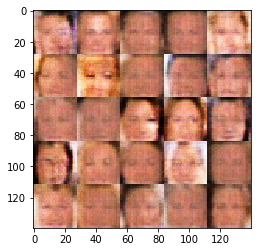

Epoch 1/10... Discriminator Loss: 0.0495... Generator Loss: 4.4615
Epoch 1/10... Discriminator Loss: 0.0820... Generator Loss: 3.0984
Epoch 1/10... Discriminator Loss: 0.4426... Generator Loss: 1.2319
Epoch 1/10... Discriminator Loss: 0.0519... Generator Loss: 4.3501
Epoch 1/10... Discriminator Loss: 0.0276... Generator Loss: 8.2028
Epoch 1/10... Discriminator Loss: 0.1766... Generator Loss: 2.3316
Epoch 1/10... Discriminator Loss: 0.7282... Generator Loss: 0.8164
Epoch 1/10... Discriminator Loss: 0.0337... Generator Loss: 6.3744
Epoch 1/10... Discriminator Loss: 0.0387... Generator Loss: 5.8105
Epoch 1/10... Discriminator Loss: 0.0202... Generator Loss: 9.0061


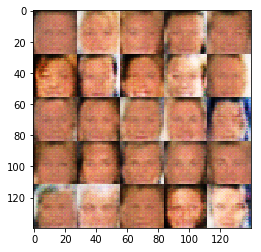

Epoch 1/10... Discriminator Loss: 0.1442... Generator Loss: 7.4295
Epoch 1/10... Discriminator Loss: 0.0392... Generator Loss: 6.9268
Epoch 1/10... Discriminator Loss: 0.0391... Generator Loss: 7.3222
Epoch 1/10... Discriminator Loss: 0.0381... Generator Loss: 6.0312
Epoch 1/10... Discriminator Loss: 0.1831... Generator Loss: 9.6350
Epoch 1/10... Discriminator Loss: 0.0331... Generator Loss: 7.0774
Epoch 1/10... Discriminator Loss: 0.1170... Generator Loss: 2.8662
Epoch 1/10... Discriminator Loss: 0.0384... Generator Loss: 4.7285
Epoch 1/10... Discriminator Loss: 0.2660... Generator Loss: 1.8734
Epoch 1/10... Discriminator Loss: 0.0244... Generator Loss: 5.2467


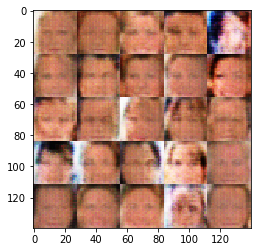

Epoch 1/10... Discriminator Loss: 0.0526... Generator Loss: 6.2408
Epoch 1/10... Discriminator Loss: 0.0606... Generator Loss: 7.8885
Epoch 1/10... Discriminator Loss: 0.0322... Generator Loss: 6.5303
Epoch 1/10... Discriminator Loss: 0.2821... Generator Loss: 1.7610
Epoch 1/10... Discriminator Loss: 0.1446... Generator Loss: 2.4939
Epoch 1/10... Discriminator Loss: 0.0555... Generator Loss: 3.8673
Epoch 1/10... Discriminator Loss: 0.0328... Generator Loss: 8.1286
Epoch 1/10... Discriminator Loss: 0.0271... Generator Loss: 8.8879
Epoch 1/10... Discriminator Loss: 0.0239... Generator Loss: 7.6374
Epoch 1/10... Discriminator Loss: 0.0833... Generator Loss: 3.2712


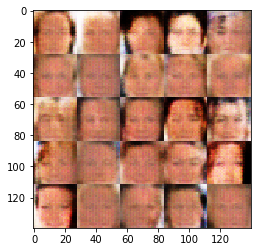

Epoch 1/10... Discriminator Loss: 0.0243... Generator Loss: 10.8394
Epoch 1/10... Discriminator Loss: 0.0241... Generator Loss: 6.8005
Epoch 1/10... Discriminator Loss: 2.1758... Generator Loss: 2.4926
Epoch 1/10... Discriminator Loss: 1.1981... Generator Loss: 4.5507
Epoch 1/10... Discriminator Loss: 0.1395... Generator Loss: 5.7659
Epoch 1/10... Discriminator Loss: 0.0429... Generator Loss: 6.2397
Epoch 1/10... Discriminator Loss: 0.0864... Generator Loss: 3.6061
Epoch 1/10... Discriminator Loss: 0.3472... Generator Loss: 1.4168
Epoch 1/10... Discriminator Loss: 0.0386... Generator Loss: 7.0966
Epoch 1/10... Discriminator Loss: 0.2927... Generator Loss: 1.6554


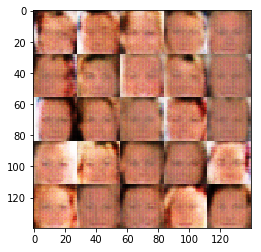

Epoch 1/10... Discriminator Loss: 0.0136... Generator Loss: 5.7750
Epoch 1/10... Discriminator Loss: 0.1181... Generator Loss: 3.0498
Epoch 1/10... Discriminator Loss: 0.2132... Generator Loss: 2.0123
Epoch 1/10... Discriminator Loss: 0.3176... Generator Loss: 1.5724
Epoch 1/10... Discriminator Loss: 0.0701... Generator Loss: 9.5757
Epoch 1/10... Discriminator Loss: 0.2217... Generator Loss: 1.9351
Epoch 1/10... Discriminator Loss: 0.0126... Generator Loss: 8.3347
Epoch 1/10... Discriminator Loss: 0.0258... Generator Loss: 8.4041
Epoch 1/10... Discriminator Loss: 0.0226... Generator Loss: 8.7633
Epoch 1/10... Discriminator Loss: 0.3438... Generator Loss: 1.5004


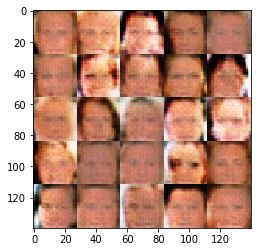

Epoch 1/10... Discriminator Loss: 0.0663... Generator Loss: 3.4006
Epoch 1/10... Discriminator Loss: 0.0200... Generator Loss: 7.4790
Epoch 1/10... Discriminator Loss: 0.1337... Generator Loss: 10.2451
Epoch 1/10... Discriminator Loss: 0.0190... Generator Loss: 9.4107
Epoch 1/10... Discriminator Loss: 0.0166... Generator Loss: 5.5794
Epoch 1/10... Discriminator Loss: 0.0172... Generator Loss: 6.7508
Epoch 1/10... Discriminator Loss: 0.0523... Generator Loss: 9.6039
Epoch 1/10... Discriminator Loss: 0.0128... Generator Loss: 7.8003
Epoch 1/10... Discriminator Loss: 0.0750... Generator Loss: 3.1995
Epoch 1/10... Discriminator Loss: 0.0213... Generator Loss: 6.2060


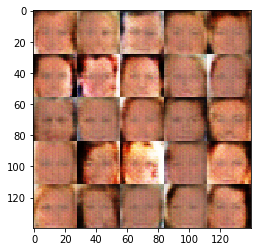

Epoch 1/10... Discriminator Loss: 0.0163... Generator Loss: 6.8554
Epoch 1/10... Discriminator Loss: 0.0163... Generator Loss: 7.8324
Epoch 1/10... Discriminator Loss: 2.0681... Generator Loss: 0.2540
Epoch 1/10... Discriminator Loss: 0.1043... Generator Loss: 3.4876
Epoch 1/10... Discriminator Loss: 0.0553... Generator Loss: 4.8736
Epoch 1/10... Discriminator Loss: 0.4517... Generator Loss: 1.2718
Epoch 1/10... Discriminator Loss: 0.0365... Generator Loss: 4.9139
Epoch 1/10... Discriminator Loss: 0.1311... Generator Loss: 2.6400
Epoch 1/10... Discriminator Loss: 0.2138... Generator Loss: 2.0185
Epoch 1/10... Discriminator Loss: 0.0306... Generator Loss: 5.1897


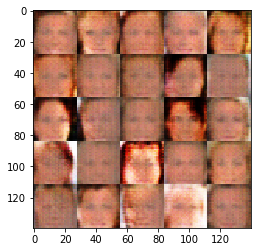

Epoch 1/10... Discriminator Loss: 0.0353... Generator Loss: 7.4269
Epoch 1/10... Discriminator Loss: 0.2159... Generator Loss: 2.0212
Epoch 1/10... Discriminator Loss: 0.0461... Generator Loss: 4.3982
Epoch 1/10... Discriminator Loss: 0.2784... Generator Loss: 1.7373
Epoch 1/10... Discriminator Loss: 0.3218... Generator Loss: 1.5120
Epoch 1/10... Discriminator Loss: 0.0251... Generator Loss: 5.9968
Epoch 1/10... Discriminator Loss: 0.9449... Generator Loss: 4.8936
Epoch 1/10... Discriminator Loss: 1.2881... Generator Loss: 5.9383
Epoch 2/10... Discriminator Loss: 0.1366... Generator Loss: 2.5477
Epoch 2/10... Discriminator Loss: 0.0686... Generator Loss: 3.9983


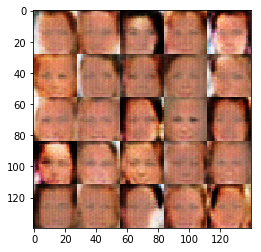

Epoch 2/10... Discriminator Loss: 0.0611... Generator Loss: 7.8417
Epoch 2/10... Discriminator Loss: 0.0502... Generator Loss: 9.2817
Epoch 2/10... Discriminator Loss: 0.0481... Generator Loss: 4.3633
Epoch 2/10... Discriminator Loss: 0.0655... Generator Loss: 3.6551
Epoch 2/10... Discriminator Loss: 0.0260... Generator Loss: 10.0574
Epoch 2/10... Discriminator Loss: 0.1218... Generator Loss: 2.8356
Epoch 2/10... Discriminator Loss: 0.0122... Generator Loss: 7.1881
Epoch 2/10... Discriminator Loss: 0.0626... Generator Loss: 7.4726
Epoch 2/10... Discriminator Loss: 0.0514... Generator Loss: 8.2386
Epoch 2/10... Discriminator Loss: 0.2348... Generator Loss: 1.8476


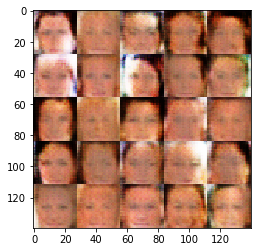

Epoch 2/10... Discriminator Loss: 0.1474... Generator Loss: 2.4826
Epoch 2/10... Discriminator Loss: 0.4839... Generator Loss: 1.1341
Epoch 2/10... Discriminator Loss: 0.2093... Generator Loss: 1.8362
Epoch 2/10... Discriminator Loss: 0.3317... Generator Loss: 1.5088
Epoch 2/10... Discriminator Loss: 0.0179... Generator Loss: 4.9475
Epoch 2/10... Discriminator Loss: 0.0194... Generator Loss: 7.0767
Epoch 2/10... Discriminator Loss: 0.0613... Generator Loss: 9.7436
Epoch 2/10... Discriminator Loss: 0.0148... Generator Loss: 6.4776
Epoch 2/10... Discriminator Loss: 0.0325... Generator Loss: 5.1421
Epoch 2/10... Discriminator Loss: 0.0479... Generator Loss: 5.0100


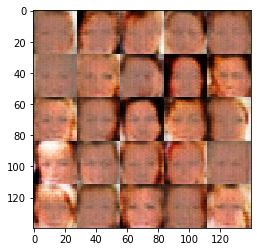

Epoch 2/10... Discriminator Loss: 0.0108... Generator Loss: 9.6143
Epoch 2/10... Discriminator Loss: 0.0217... Generator Loss: 9.7310
Epoch 2/10... Discriminator Loss: 0.0150... Generator Loss: 6.6991
Epoch 2/10... Discriminator Loss: 0.0450... Generator Loss: 6.0513
Epoch 2/10... Discriminator Loss: 1.2325... Generator Loss: 0.5725
Epoch 2/10... Discriminator Loss: 0.0594... Generator Loss: 4.1330
Epoch 2/10... Discriminator Loss: 0.0942... Generator Loss: 8.8317
Epoch 2/10... Discriminator Loss: 0.1625... Generator Loss: 9.9039
Epoch 2/10... Discriminator Loss: 0.0514... Generator Loss: 8.4033
Epoch 2/10... Discriminator Loss: 0.0971... Generator Loss: 8.8993


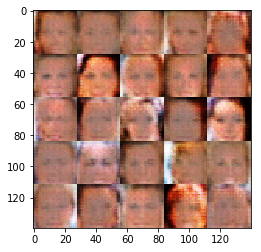

Epoch 2/10... Discriminator Loss: 0.0399... Generator Loss: 4.2815
Epoch 2/10... Discriminator Loss: 0.0637... Generator Loss: 8.6001
Epoch 2/10... Discriminator Loss: 0.0277... Generator Loss: 9.6134
Epoch 2/10... Discriminator Loss: 0.0520... Generator Loss: 4.0635
Epoch 2/10... Discriminator Loss: 0.1306... Generator Loss: 2.7672
Epoch 2/10... Discriminator Loss: 0.0215... Generator Loss: 8.5620
Epoch 2/10... Discriminator Loss: 4.1893... Generator Loss: 8.2692
Epoch 2/10... Discriminator Loss: 0.0717... Generator Loss: 3.8799
Epoch 2/10... Discriminator Loss: 0.0548... Generator Loss: 7.7020
Epoch 2/10... Discriminator Loss: 0.1358... Generator Loss: 2.4686


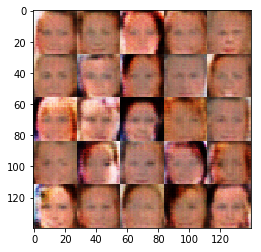

Epoch 2/10... Discriminator Loss: 0.0369... Generator Loss: 8.8425
Epoch 2/10... Discriminator Loss: 0.0280... Generator Loss: 8.3657
Epoch 2/10... Discriminator Loss: 0.1205... Generator Loss: 2.6535
Epoch 2/10... Discriminator Loss: 0.0598... Generator Loss: 9.5640
Epoch 2/10... Discriminator Loss: 0.0562... Generator Loss: 9.0148
Epoch 2/10... Discriminator Loss: 0.0348... Generator Loss: 4.2291
Epoch 2/10... Discriminator Loss: 0.0206... Generator Loss: 5.9652
Epoch 2/10... Discriminator Loss: 0.1802... Generator Loss: 2.3002
Epoch 2/10... Discriminator Loss: 0.3281... Generator Loss: 1.4756
Epoch 2/10... Discriminator Loss: 0.0350... Generator Loss: 8.3456


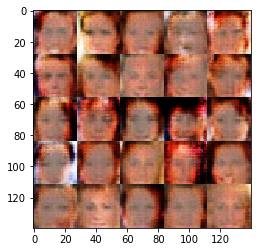

Epoch 2/10... Discriminator Loss: 0.0219... Generator Loss: 9.3103
Epoch 2/10... Discriminator Loss: 0.2012... Generator Loss: 1.9672
Epoch 2/10... Discriminator Loss: 0.0299... Generator Loss: 8.9520
Epoch 2/10... Discriminator Loss: 0.0414... Generator Loss: 10.8889
Epoch 2/10... Discriminator Loss: 0.0155... Generator Loss: 9.8676
Epoch 2/10... Discriminator Loss: 0.0841... Generator Loss: 3.2553
Epoch 2/10... Discriminator Loss: 0.1408... Generator Loss: 10.1457
Epoch 2/10... Discriminator Loss: 0.0205... Generator Loss: 10.0678
Epoch 2/10... Discriminator Loss: 0.0430... Generator Loss: 3.7547
Epoch 2/10... Discriminator Loss: 0.1876... Generator Loss: 2.1692


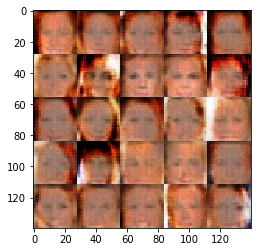

Epoch 2/10... Discriminator Loss: 0.1424... Generator Loss: 5.7821
Epoch 2/10... Discriminator Loss: 0.0338... Generator Loss: 4.7359
Epoch 2/10... Discriminator Loss: 0.0092... Generator Loss: 6.6642
Epoch 2/10... Discriminator Loss: 0.0264... Generator Loss: 6.3722
Epoch 2/10... Discriminator Loss: 0.3338... Generator Loss: 11.2641
Epoch 2/10... Discriminator Loss: 0.0277... Generator Loss: 4.9990
Epoch 2/10... Discriminator Loss: 0.0447... Generator Loss: 3.9447
Epoch 2/10... Discriminator Loss: 0.0388... Generator Loss: 4.1979
Epoch 2/10... Discriminator Loss: 0.0446... Generator Loss: 4.0143
Epoch 2/10... Discriminator Loss: 0.0201... Generator Loss: 9.9222


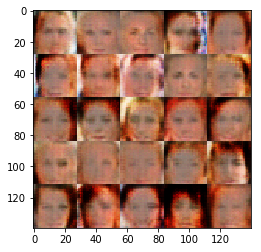

Epoch 2/10... Discriminator Loss: 0.0605... Generator Loss: 8.2836
Epoch 2/10... Discriminator Loss: 0.0460... Generator Loss: 12.5617
Epoch 2/10... Discriminator Loss: 0.0305... Generator Loss: 5.1630
Epoch 2/10... Discriminator Loss: 0.0132... Generator Loss: 6.7299
Epoch 2/10... Discriminator Loss: 0.0263... Generator Loss: 8.6591
Epoch 2/10... Discriminator Loss: 0.0191... Generator Loss: 5.2659
Epoch 2/10... Discriminator Loss: 0.0710... Generator Loss: 3.2410
Epoch 2/10... Discriminator Loss: 0.0686... Generator Loss: 3.4848
Epoch 2/10... Discriminator Loss: 0.0113... Generator Loss: 8.2745
Epoch 2/10... Discriminator Loss: 0.0157... Generator Loss: 5.5995


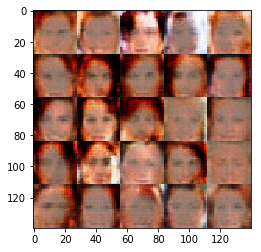

Epoch 2/10... Discriminator Loss: 0.2749... Generator Loss: 1.6610
Epoch 2/10... Discriminator Loss: 0.0184... Generator Loss: 5.6452
Epoch 2/10... Discriminator Loss: 0.2663... Generator Loss: 1.7090
Epoch 2/10... Discriminator Loss: 0.0123... Generator Loss: 10.4960
Epoch 2/10... Discriminator Loss: 2.2200... Generator Loss: 0.3094
Epoch 2/10... Discriminator Loss: 1.2852... Generator Loss: 0.5065
Epoch 2/10... Discriminator Loss: 2.2050... Generator Loss: 0.1540
Epoch 2/10... Discriminator Loss: 0.5601... Generator Loss: 1.2610
Epoch 2/10... Discriminator Loss: 0.1201... Generator Loss: 3.2242
Epoch 2/10... Discriminator Loss: 1.0022... Generator Loss: 0.6251


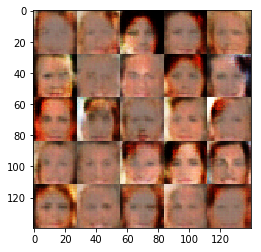

Epoch 2/10... Discriminator Loss: 0.1545... Generator Loss: 2.8099
Epoch 2/10... Discriminator Loss: 0.1834... Generator Loss: 2.2719
Epoch 2/10... Discriminator Loss: 0.2708... Generator Loss: 1.8304
Epoch 2/10... Discriminator Loss: 0.0593... Generator Loss: 3.9522
Epoch 2/10... Discriminator Loss: 0.0208... Generator Loss: 6.1080
Epoch 2/10... Discriminator Loss: 0.0988... Generator Loss: 3.2887
Epoch 2/10... Discriminator Loss: 0.0164... Generator Loss: 7.8633
Epoch 2/10... Discriminator Loss: 0.1023... Generator Loss: 3.0965
Epoch 2/10... Discriminator Loss: 0.0182... Generator Loss: 4.9830
Epoch 2/10... Discriminator Loss: 0.0122... Generator Loss: 7.1893


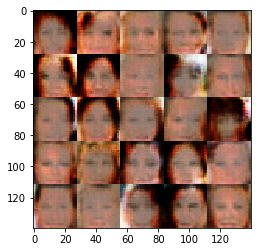

Epoch 2/10... Discriminator Loss: 0.0339... Generator Loss: 6.4233
Epoch 2/10... Discriminator Loss: 0.0249... Generator Loss: 10.0537
Epoch 2/10... Discriminator Loss: 0.1451... Generator Loss: 2.4017
Epoch 2/10... Discriminator Loss: 0.0201... Generator Loss: 6.4994
Epoch 2/10... Discriminator Loss: 0.0251... Generator Loss: 6.3660
Epoch 2/10... Discriminator Loss: 0.0120... Generator Loss: 7.6824
Epoch 2/10... Discriminator Loss: 0.0315... Generator Loss: 6.4229
Epoch 2/10... Discriminator Loss: 0.0343... Generator Loss: 9.2097
Epoch 2/10... Discriminator Loss: 0.3499... Generator Loss: 1.4320
Epoch 2/10... Discriminator Loss: 0.0190... Generator Loss: 4.8779


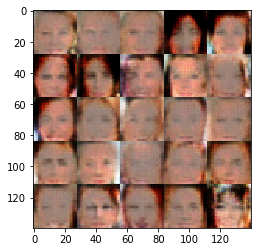

Epoch 2/10... Discriminator Loss: 0.0103... Generator Loss: 8.3098
Epoch 2/10... Discriminator Loss: 0.0333... Generator Loss: 6.2903
Epoch 2/10... Discriminator Loss: 0.0099... Generator Loss: 7.7554
Epoch 2/10... Discriminator Loss: 0.0226... Generator Loss: 4.5562
Epoch 2/10... Discriminator Loss: 0.0160... Generator Loss: 5.5221
Epoch 2/10... Discriminator Loss: 0.0235... Generator Loss: 6.9776
Epoch 2/10... Discriminator Loss: 0.2128... Generator Loss: 1.9844
Epoch 2/10... Discriminator Loss: 0.2922... Generator Loss: 1.6398
Epoch 2/10... Discriminator Loss: 0.0815... Generator Loss: 3.2833
Epoch 2/10... Discriminator Loss: 0.0279... Generator Loss: 4.6238


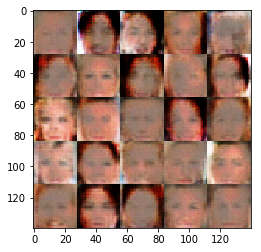

Epoch 2/10... Discriminator Loss: 0.0126... Generator Loss: 6.8426
Epoch 2/10... Discriminator Loss: 0.3544... Generator Loss: 1.4857
Epoch 2/10... Discriminator Loss: 2.0817... Generator Loss: 2.7681
Epoch 2/10... Discriminator Loss: 1.1065... Generator Loss: 2.4496
Epoch 2/10... Discriminator Loss: 0.7261... Generator Loss: 2.2861
Epoch 2/10... Discriminator Loss: 0.5057... Generator Loss: 1.7529
Epoch 2/10... Discriminator Loss: 0.7365... Generator Loss: 0.8430
Epoch 2/10... Discriminator Loss: 2.2289... Generator Loss: 0.2186
Epoch 2/10... Discriminator Loss: 0.4005... Generator Loss: 2.1916
Epoch 2/10... Discriminator Loss: 0.2291... Generator Loss: 2.3594


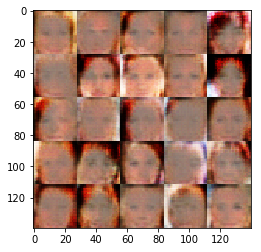

Epoch 2/10... Discriminator Loss: 0.1837... Generator Loss: 3.8132
Epoch 2/10... Discriminator Loss: 0.0645... Generator Loss: 4.0617
Epoch 2/10... Discriminator Loss: 0.4695... Generator Loss: 1.3448
Epoch 2/10... Discriminator Loss: 0.2993... Generator Loss: 1.7490
Epoch 2/10... Discriminator Loss: 0.0446... Generator Loss: 4.2336
Epoch 2/10... Discriminator Loss: 0.0998... Generator Loss: 2.7770
Epoch 2/10... Discriminator Loss: 0.1946... Generator Loss: 2.1522
Epoch 2/10... Discriminator Loss: 0.1234... Generator Loss: 2.8436
Epoch 2/10... Discriminator Loss: 0.1208... Generator Loss: 7.5533
Epoch 2/10... Discriminator Loss: 0.0345... Generator Loss: 4.2948


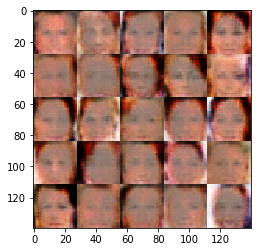

Epoch 2/10... Discriminator Loss: 0.0352... Generator Loss: 6.7229
Epoch 2/10... Discriminator Loss: 0.1578... Generator Loss: 9.1515
Epoch 2/10... Discriminator Loss: 0.2259... Generator Loss: 5.2629
Epoch 2/10... Discriminator Loss: 1.1060... Generator Loss: 0.7843
Epoch 2/10... Discriminator Loss: 0.9457... Generator Loss: 1.8385
Epoch 2/10... Discriminator Loss: 1.0022... Generator Loss: 0.5944
Epoch 2/10... Discriminator Loss: 0.3430... Generator Loss: 2.3010
Epoch 2/10... Discriminator Loss: 0.0695... Generator Loss: 3.7610
Epoch 2/10... Discriminator Loss: 0.0627... Generator Loss: 4.8820
Epoch 2/10... Discriminator Loss: 0.0442... Generator Loss: 4.9535


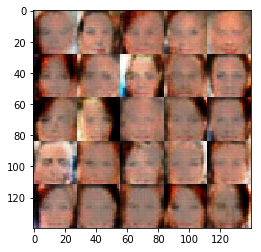

Epoch 2/10... Discriminator Loss: 0.2099... Generator Loss: 7.1382
Epoch 2/10... Discriminator Loss: 0.4547... Generator Loss: 1.3057
Epoch 2/10... Discriminator Loss: 0.0292... Generator Loss: 5.3622
Epoch 2/10... Discriminator Loss: 0.0215... Generator Loss: 7.6408
Epoch 2/10... Discriminator Loss: 0.5612... Generator Loss: 1.0292
Epoch 2/10... Discriminator Loss: 0.0210... Generator Loss: 7.8865
Epoch 3/10... Discriminator Loss: 0.1622... Generator Loss: 2.2329
Epoch 3/10... Discriminator Loss: 0.0487... Generator Loss: 4.2211
Epoch 3/10... Discriminator Loss: 0.0682... Generator Loss: 3.2037
Epoch 3/10... Discriminator Loss: 1.8843... Generator Loss: 1.9950


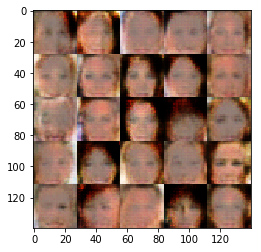

Epoch 3/10... Discriminator Loss: 0.9659... Generator Loss: 2.0890
Epoch 3/10... Discriminator Loss: 0.6788... Generator Loss: 1.9810
Epoch 3/10... Discriminator Loss: 0.5779... Generator Loss: 1.0605
Epoch 3/10... Discriminator Loss: 0.3602... Generator Loss: 2.2707
Epoch 3/10... Discriminator Loss: 0.5411... Generator Loss: 2.7376
Epoch 3/10... Discriminator Loss: 0.4398... Generator Loss: 2.2932
Epoch 3/10... Discriminator Loss: 0.8701... Generator Loss: 0.7145
Epoch 3/10... Discriminator Loss: 0.6055... Generator Loss: 1.1883
Epoch 3/10... Discriminator Loss: 0.4897... Generator Loss: 1.5817
Epoch 3/10... Discriminator Loss: 0.7611... Generator Loss: 2.4964


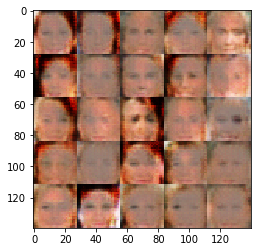

Epoch 3/10... Discriminator Loss: 0.5015... Generator Loss: 1.8594
Epoch 3/10... Discriminator Loss: 1.8670... Generator Loss: 0.2438
Epoch 3/10... Discriminator Loss: 0.4820... Generator Loss: 1.7138
Epoch 3/10... Discriminator Loss: 0.5060... Generator Loss: 1.2352
Epoch 3/10... Discriminator Loss: 0.3656... Generator Loss: 1.5023
Epoch 3/10... Discriminator Loss: 0.0976... Generator Loss: 3.3143
Epoch 3/10... Discriminator Loss: 0.1347... Generator Loss: 4.2007
Epoch 3/10... Discriminator Loss: 0.0911... Generator Loss: 3.2125
Epoch 3/10... Discriminator Loss: 0.1530... Generator Loss: 2.2561
Epoch 3/10... Discriminator Loss: 0.2663... Generator Loss: 6.3716


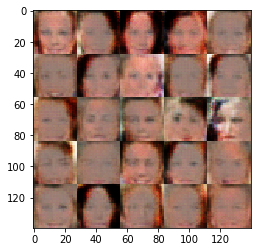

Epoch 3/10... Discriminator Loss: 0.0350... Generator Loss: 7.1109
Epoch 3/10... Discriminator Loss: 0.0256... Generator Loss: 4.9406
Epoch 3/10... Discriminator Loss: 0.0555... Generator Loss: 3.5704
Epoch 3/10... Discriminator Loss: 0.0340... Generator Loss: 4.6151
Epoch 3/10... Discriminator Loss: 0.0353... Generator Loss: 4.5205
Epoch 3/10... Discriminator Loss: 0.0198... Generator Loss: 6.0766
Epoch 3/10... Discriminator Loss: 0.0121... Generator Loss: 6.6688
Epoch 3/10... Discriminator Loss: 0.0211... Generator Loss: 6.0793
Epoch 3/10... Discriminator Loss: 0.0352... Generator Loss: 4.8657
Epoch 3/10... Discriminator Loss: 0.4814... Generator Loss: 1.2129


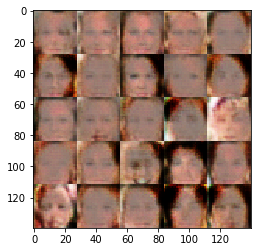

Epoch 3/10... Discriminator Loss: 0.0182... Generator Loss: 6.9552
Epoch 3/10... Discriminator Loss: 0.0290... Generator Loss: 4.9292
Epoch 3/10... Discriminator Loss: 0.0229... Generator Loss: 4.7598
Epoch 3/10... Discriminator Loss: 0.0266... Generator Loss: 7.2478
Epoch 3/10... Discriminator Loss: 0.0181... Generator Loss: 5.3306
Epoch 3/10... Discriminator Loss: 0.0734... Generator Loss: 3.1194
Epoch 3/10... Discriminator Loss: 3.4868... Generator Loss: 0.0465
Epoch 3/10... Discriminator Loss: 0.5370... Generator Loss: 1.5019
Epoch 3/10... Discriminator Loss: 0.5422... Generator Loss: 1.4290
Epoch 3/10... Discriminator Loss: 0.3762... Generator Loss: 1.8673


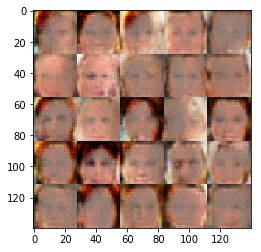

Epoch 3/10... Discriminator Loss: 0.8108... Generator Loss: 4.0060
Epoch 3/10... Discriminator Loss: 0.3930... Generator Loss: 1.7220
Epoch 3/10... Discriminator Loss: 0.3481... Generator Loss: 1.7906
Epoch 3/10... Discriminator Loss: 0.3363... Generator Loss: 1.6282
Epoch 3/10... Discriminator Loss: 0.4124... Generator Loss: 1.5590
Epoch 3/10... Discriminator Loss: 3.0864... Generator Loss: 5.0293
Epoch 3/10... Discriminator Loss: 0.5861... Generator Loss: 2.2858
Epoch 3/10... Discriminator Loss: 0.3376... Generator Loss: 1.7517
Epoch 3/10... Discriminator Loss: 1.1969... Generator Loss: 3.8747
Epoch 3/10... Discriminator Loss: 0.4464... Generator Loss: 1.5066


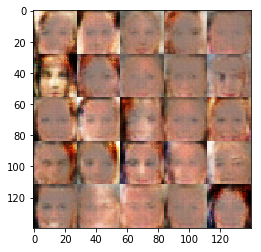

Epoch 3/10... Discriminator Loss: 0.2006... Generator Loss: 2.3212
Epoch 3/10... Discriminator Loss: 0.1426... Generator Loss: 2.7269
Epoch 3/10... Discriminator Loss: 0.3217... Generator Loss: 1.6633
Epoch 3/10... Discriminator Loss: 0.0422... Generator Loss: 4.5441
Epoch 3/10... Discriminator Loss: 1.2513... Generator Loss: 3.7393
Epoch 3/10... Discriminator Loss: 0.8404... Generator Loss: 2.0078
Epoch 3/10... Discriminator Loss: 0.6031... Generator Loss: 1.1761
Epoch 3/10... Discriminator Loss: 0.6923... Generator Loss: 0.9138
Epoch 3/10... Discriminator Loss: 0.4635... Generator Loss: 2.1423
Epoch 3/10... Discriminator Loss: 0.3116... Generator Loss: 1.8390


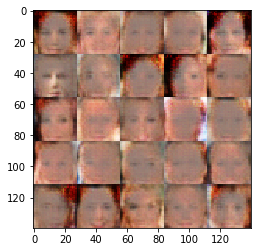

Epoch 3/10... Discriminator Loss: 0.1261... Generator Loss: 3.1799
Epoch 3/10... Discriminator Loss: 0.2556... Generator Loss: 1.8314
Epoch 3/10... Discriminator Loss: 0.1302... Generator Loss: 2.6670
Epoch 3/10... Discriminator Loss: 1.3916... Generator Loss: 0.3452
Epoch 3/10... Discriminator Loss: 0.8515... Generator Loss: 0.9478
Epoch 3/10... Discriminator Loss: 0.6960... Generator Loss: 1.9172
Epoch 3/10... Discriminator Loss: 0.4774... Generator Loss: 1.8586
Epoch 3/10... Discriminator Loss: 0.3158... Generator Loss: 1.7348
Epoch 3/10... Discriminator Loss: 2.1356... Generator Loss: 0.3608
Epoch 3/10... Discriminator Loss: 0.4438... Generator Loss: 1.8883


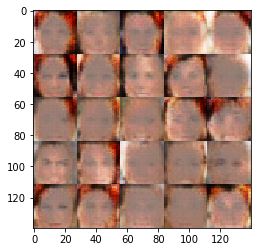

Epoch 3/10... Discriminator Loss: 0.2309... Generator Loss: 2.9016
Epoch 3/10... Discriminator Loss: 0.1247... Generator Loss: 2.7446
Epoch 3/10... Discriminator Loss: 0.0764... Generator Loss: 3.3796
Epoch 3/10... Discriminator Loss: 0.3139... Generator Loss: 1.6075
Epoch 3/10... Discriminator Loss: 0.0403... Generator Loss: 4.9940
Epoch 3/10... Discriminator Loss: 0.1667... Generator Loss: 2.3333
Epoch 3/10... Discriminator Loss: 0.1097... Generator Loss: 2.9007
Epoch 3/10... Discriminator Loss: 0.1963... Generator Loss: 2.1326
Epoch 3/10... Discriminator Loss: 0.0622... Generator Loss: 3.3733
Epoch 3/10... Discriminator Loss: 0.0340... Generator Loss: 6.2646


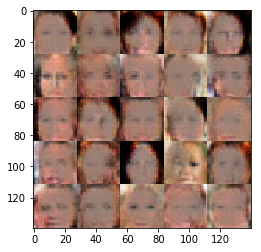

Epoch 3/10... Discriminator Loss: 0.0387... Generator Loss: 4.8308
Epoch 3/10... Discriminator Loss: 0.1263... Generator Loss: 2.5983
Epoch 3/10... Discriminator Loss: 0.0386... Generator Loss: 4.6762
Epoch 3/10... Discriminator Loss: 0.0485... Generator Loss: 3.8708
Epoch 3/10... Discriminator Loss: 0.0334... Generator Loss: 5.3447
Epoch 3/10... Discriminator Loss: 0.0177... Generator Loss: 7.2104
Epoch 3/10... Discriminator Loss: 0.0392... Generator Loss: 5.7079
Epoch 3/10... Discriminator Loss: 0.1760... Generator Loss: 2.2403
Epoch 3/10... Discriminator Loss: 0.0334... Generator Loss: 4.3439
Epoch 3/10... Discriminator Loss: 0.0295... Generator Loss: 6.1553


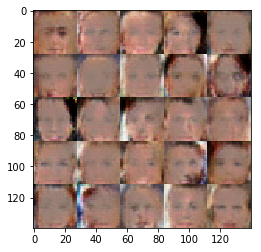

Epoch 3/10... Discriminator Loss: 0.0402... Generator Loss: 4.0660
Epoch 3/10... Discriminator Loss: 0.0370... Generator Loss: 4.5891
Epoch 3/10... Discriminator Loss: 0.3499... Generator Loss: 1.4618
Epoch 3/10... Discriminator Loss: 0.0479... Generator Loss: 3.9746
Epoch 3/10... Discriminator Loss: 0.0484... Generator Loss: 7.6954
Epoch 3/10... Discriminator Loss: 0.0325... Generator Loss: 4.4719
Epoch 3/10... Discriminator Loss: 0.1124... Generator Loss: 2.8514
Epoch 3/10... Discriminator Loss: 0.0168... Generator Loss: 5.3555
Epoch 3/10... Discriminator Loss: 0.4533... Generator Loss: 1.2557
Epoch 3/10... Discriminator Loss: 1.1454... Generator Loss: 0.5899


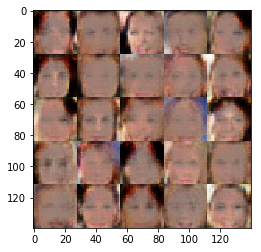

Epoch 3/10... Discriminator Loss: 0.7525... Generator Loss: 0.9202
Epoch 3/10... Discriminator Loss: 0.5086... Generator Loss: 1.3504
Epoch 3/10... Discriminator Loss: 0.5054... Generator Loss: 1.1991
Epoch 3/10... Discriminator Loss: 0.3731... Generator Loss: 1.9772
Epoch 3/10... Discriminator Loss: 0.3658... Generator Loss: 1.5920
Epoch 3/10... Discriminator Loss: 3.3785... Generator Loss: 0.0490
Epoch 3/10... Discriminator Loss: 0.4710... Generator Loss: 1.3970
Epoch 3/10... Discriminator Loss: 0.5413... Generator Loss: 2.9689
Epoch 3/10... Discriminator Loss: 0.4966... Generator Loss: 1.4909
Epoch 3/10... Discriminator Loss: 0.4146... Generator Loss: 1.6347


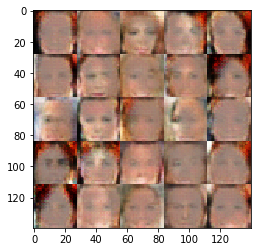

Epoch 3/10... Discriminator Loss: 1.1724... Generator Loss: 0.4836
Epoch 3/10... Discriminator Loss: 0.3824... Generator Loss: 1.7803
Epoch 3/10... Discriminator Loss: 0.1576... Generator Loss: 4.7307
Epoch 3/10... Discriminator Loss: 0.0937... Generator Loss: 2.9352
Epoch 3/10... Discriminator Loss: 0.0676... Generator Loss: 3.3549
Epoch 3/10... Discriminator Loss: 3.2175... Generator Loss: 0.0810
Epoch 3/10... Discriminator Loss: 1.2118... Generator Loss: 0.6071
Epoch 3/10... Discriminator Loss: 1.0496... Generator Loss: 0.6246
Epoch 3/10... Discriminator Loss: 0.4657... Generator Loss: 1.6906
Epoch 3/10... Discriminator Loss: 0.5215... Generator Loss: 2.2609


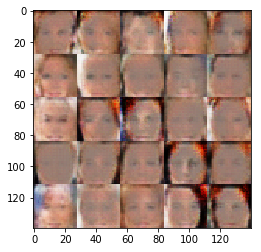

Epoch 3/10... Discriminator Loss: 0.3604... Generator Loss: 1.9995
Epoch 3/10... Discriminator Loss: 0.1147... Generator Loss: 2.6674
Epoch 3/10... Discriminator Loss: 0.0644... Generator Loss: 3.8661
Epoch 3/10... Discriminator Loss: 0.3609... Generator Loss: 1.4843
Epoch 3/10... Discriminator Loss: 0.0827... Generator Loss: 3.4861
Epoch 3/10... Discriminator Loss: 0.1265... Generator Loss: 2.5718
Epoch 3/10... Discriminator Loss: 0.2154... Generator Loss: 2.0864
Epoch 3/10... Discriminator Loss: 0.0864... Generator Loss: 3.4620
Epoch 3/10... Discriminator Loss: 0.0282... Generator Loss: 5.5174
Epoch 3/10... Discriminator Loss: 0.9049... Generator Loss: 1.2652


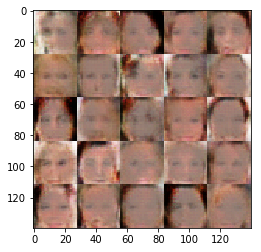

Epoch 3/10... Discriminator Loss: 1.0539... Generator Loss: 0.6046
Epoch 3/10... Discriminator Loss: 0.2519... Generator Loss: 1.9449
Epoch 3/10... Discriminator Loss: 0.9889... Generator Loss: 0.6736
Epoch 3/10... Discriminator Loss: 0.7491... Generator Loss: 1.0420
Epoch 3/10... Discriminator Loss: 1.1675... Generator Loss: 4.1994
Epoch 3/10... Discriminator Loss: 0.1191... Generator Loss: 3.2991
Epoch 3/10... Discriminator Loss: 0.0782... Generator Loss: 4.8229
Epoch 3/10... Discriminator Loss: 0.0995... Generator Loss: 4.0542
Epoch 3/10... Discriminator Loss: 0.0323... Generator Loss: 6.1375
Epoch 3/10... Discriminator Loss: 0.0362... Generator Loss: 6.4465


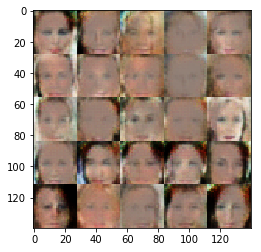

Epoch 3/10... Discriminator Loss: 0.0979... Generator Loss: 3.2496
Epoch 3/10... Discriminator Loss: 0.1382... Generator Loss: 5.0269
Epoch 3/10... Discriminator Loss: 0.0282... Generator Loss: 5.6887
Epoch 3/10... Discriminator Loss: 0.0344... Generator Loss: 4.2894
Epoch 3/10... Discriminator Loss: 0.2008... Generator Loss: 2.0840
Epoch 3/10... Discriminator Loss: 0.0430... Generator Loss: 6.7229
Epoch 3/10... Discriminator Loss: 0.0336... Generator Loss: 4.8461
Epoch 3/10... Discriminator Loss: 0.1842... Generator Loss: 2.0821
Epoch 3/10... Discriminator Loss: 0.0549... Generator Loss: 5.3042
Epoch 3/10... Discriminator Loss: 0.2095... Generator Loss: 1.9615


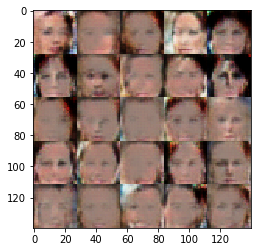

Epoch 3/10... Discriminator Loss: 0.0372... Generator Loss: 3.9633
Epoch 3/10... Discriminator Loss: 0.0493... Generator Loss: 3.5635
Epoch 3/10... Discriminator Loss: 0.0434... Generator Loss: 4.0130
Epoch 3/10... Discriminator Loss: 0.1156... Generator Loss: 6.6263
Epoch 4/10... Discriminator Loss: 0.7484... Generator Loss: 1.2385
Epoch 4/10... Discriminator Loss: 0.4999... Generator Loss: 1.5779
Epoch 4/10... Discriminator Loss: 0.3464... Generator Loss: 2.1902
Epoch 4/10... Discriminator Loss: 0.4026... Generator Loss: 1.5195
Epoch 4/10... Discriminator Loss: 0.3553... Generator Loss: 3.2447
Epoch 4/10... Discriminator Loss: 0.3396... Generator Loss: 1.6461


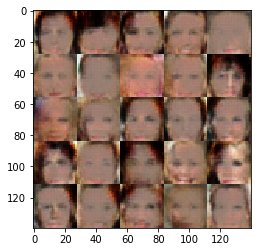

Epoch 4/10... Discriminator Loss: 0.1511... Generator Loss: 2.4675
Epoch 4/10... Discriminator Loss: 0.0637... Generator Loss: 6.7410
Epoch 4/10... Discriminator Loss: 0.1961... Generator Loss: 2.1492
Epoch 4/10... Discriminator Loss: 4.8033... Generator Loss: 7.0742
Epoch 4/10... Discriminator Loss: 0.9729... Generator Loss: 1.0827
Epoch 4/10... Discriminator Loss: 0.6889... Generator Loss: 1.1008
Epoch 4/10... Discriminator Loss: 0.4822... Generator Loss: 1.2754
Epoch 4/10... Discriminator Loss: 6.0552... Generator Loss: 7.9828
Epoch 4/10... Discriminator Loss: 0.7542... Generator Loss: 1.5729
Epoch 4/10... Discriminator Loss: 0.4101... Generator Loss: 1.5103


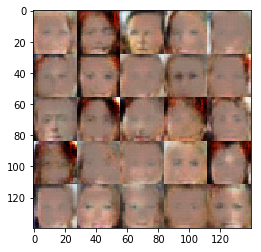

Epoch 4/10... Discriminator Loss: 0.6900... Generator Loss: 0.9540
Epoch 4/10... Discriminator Loss: 0.1177... Generator Loss: 3.9195
Epoch 4/10... Discriminator Loss: 0.0389... Generator Loss: 4.6700
Epoch 4/10... Discriminator Loss: 1.6346... Generator Loss: 0.3074
Epoch 4/10... Discriminator Loss: 0.6505... Generator Loss: 2.2729
Epoch 4/10... Discriminator Loss: 0.5511... Generator Loss: 1.4556
Epoch 4/10... Discriminator Loss: 0.4698... Generator Loss: 2.7181
Epoch 4/10... Discriminator Loss: 0.2473... Generator Loss: 2.3136
Epoch 4/10... Discriminator Loss: 0.0957... Generator Loss: 3.1114
Epoch 4/10... Discriminator Loss: 0.1134... Generator Loss: 3.0018


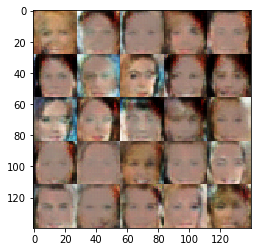

Epoch 4/10... Discriminator Loss: 0.0595... Generator Loss: 5.0137
Epoch 4/10... Discriminator Loss: 0.0314... Generator Loss: 4.7991
Epoch 4/10... Discriminator Loss: 0.0458... Generator Loss: 5.3003
Epoch 4/10... Discriminator Loss: 0.2313... Generator Loss: 1.8916
Epoch 4/10... Discriminator Loss: 0.0574... Generator Loss: 3.2091
Epoch 4/10... Discriminator Loss: 1.3688... Generator Loss: 0.4232
Epoch 4/10... Discriminator Loss: 0.7552... Generator Loss: 0.9676
Epoch 4/10... Discriminator Loss: 0.3968... Generator Loss: 2.3455
Epoch 4/10... Discriminator Loss: 1.9673... Generator Loss: 0.2021
Epoch 4/10... Discriminator Loss: 0.3023... Generator Loss: 1.6673


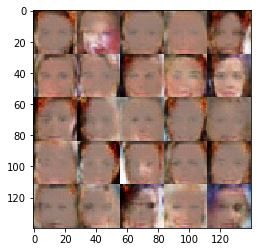

Epoch 4/10... Discriminator Loss: 0.1523... Generator Loss: 4.5885
Epoch 4/10... Discriminator Loss: 0.6042... Generator Loss: 1.0500
Epoch 4/10... Discriminator Loss: 0.1804... Generator Loss: 2.1886
Epoch 4/10... Discriminator Loss: 0.0413... Generator Loss: 4.4680
Epoch 4/10... Discriminator Loss: 0.1379... Generator Loss: 2.4456
Epoch 4/10... Discriminator Loss: 0.0671... Generator Loss: 3.3264
Epoch 4/10... Discriminator Loss: 0.2566... Generator Loss: 1.8139
Epoch 4/10... Discriminator Loss: 0.0443... Generator Loss: 5.2163
Epoch 4/10... Discriminator Loss: 0.1127... Generator Loss: 2.9481
Epoch 4/10... Discriminator Loss: 0.0256... Generator Loss: 5.9132


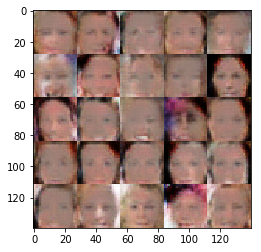

Epoch 4/10... Discriminator Loss: 0.3481... Generator Loss: 1.4993
Epoch 4/10... Discriminator Loss: 3.4591... Generator Loss: 0.0552
Epoch 4/10... Discriminator Loss: 0.6936... Generator Loss: 1.1547
Epoch 4/10... Discriminator Loss: 0.6047... Generator Loss: 2.4165
Epoch 4/10... Discriminator Loss: 0.3898... Generator Loss: 1.8468
Epoch 4/10... Discriminator Loss: 0.3224... Generator Loss: 2.4277
Epoch 4/10... Discriminator Loss: 0.8992... Generator Loss: 3.5540
Epoch 4/10... Discriminator Loss: 0.6745... Generator Loss: 1.9226
Epoch 4/10... Discriminator Loss: 0.5434... Generator Loss: 2.6850
Epoch 4/10... Discriminator Loss: 0.4420... Generator Loss: 1.5185


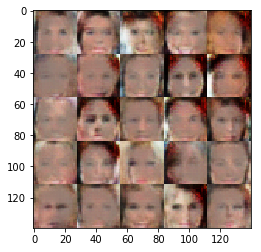

Epoch 4/10... Discriminator Loss: 0.0739... Generator Loss: 3.4377
Epoch 4/10... Discriminator Loss: 0.1298... Generator Loss: 2.8307
Epoch 4/10... Discriminator Loss: 0.0461... Generator Loss: 4.6802
Epoch 4/10... Discriminator Loss: 0.0295... Generator Loss: 4.9580
Epoch 4/10... Discriminator Loss: 2.2779... Generator Loss: 0.3607
Epoch 4/10... Discriminator Loss: 0.6877... Generator Loss: 1.6958
Epoch 4/10... Discriminator Loss: 0.3992... Generator Loss: 1.5116
Epoch 4/10... Discriminator Loss: 0.6006... Generator Loss: 3.9085
Epoch 4/10... Discriminator Loss: 1.0942... Generator Loss: 2.1962
Epoch 4/10... Discriminator Loss: 0.2874... Generator Loss: 1.8398


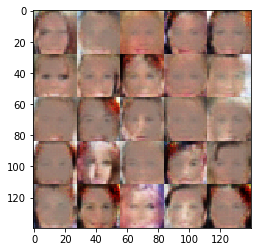

Epoch 4/10... Discriminator Loss: 0.2449... Generator Loss: 1.8907
Epoch 4/10... Discriminator Loss: 0.3767... Generator Loss: 1.4683
Epoch 4/10... Discriminator Loss: 0.3992... Generator Loss: 1.3030
Epoch 4/10... Discriminator Loss: 0.0510... Generator Loss: 5.6677
Epoch 4/10... Discriminator Loss: 0.0838... Generator Loss: 3.2430
Epoch 4/10... Discriminator Loss: 0.6656... Generator Loss: 3.7747
Epoch 4/10... Discriminator Loss: 0.6608... Generator Loss: 1.5399
Epoch 4/10... Discriminator Loss: 0.5348... Generator Loss: 1.4656
Epoch 4/10... Discriminator Loss: 0.3904... Generator Loss: 1.7979
Epoch 4/10... Discriminator Loss: 0.2119... Generator Loss: 2.2079


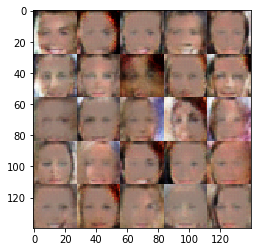

Epoch 4/10... Discriminator Loss: 0.1349... Generator Loss: 2.6806
Epoch 4/10... Discriminator Loss: 0.2818... Generator Loss: 1.7329
Epoch 4/10... Discriminator Loss: 0.1211... Generator Loss: 2.6062
Epoch 4/10... Discriminator Loss: 0.0702... Generator Loss: 3.4981
Epoch 4/10... Discriminator Loss: 0.0706... Generator Loss: 3.2286
Epoch 4/10... Discriminator Loss: 0.0453... Generator Loss: 4.1297
Epoch 4/10... Discriminator Loss: 0.0961... Generator Loss: 4.8086
Epoch 4/10... Discriminator Loss: 0.0125... Generator Loss: 7.6411
Epoch 4/10... Discriminator Loss: 0.0335... Generator Loss: 6.5251
Epoch 4/10... Discriminator Loss: 0.0868... Generator Loss: 2.8952


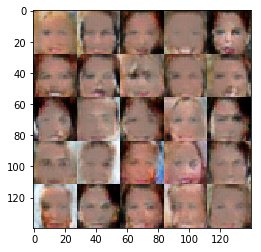

Epoch 4/10... Discriminator Loss: 0.0473... Generator Loss: 4.3657
Epoch 4/10... Discriminator Loss: 0.0288... Generator Loss: 4.2362
Epoch 4/10... Discriminator Loss: 0.0647... Generator Loss: 3.5730
Epoch 4/10... Discriminator Loss: 0.0533... Generator Loss: 3.6149
Epoch 4/10... Discriminator Loss: 0.0512... Generator Loss: 3.7767
Epoch 4/10... Discriminator Loss: 0.1521... Generator Loss: 2.7966
Epoch 4/10... Discriminator Loss: 0.0488... Generator Loss: 3.6248
Epoch 4/10... Discriminator Loss: 0.0520... Generator Loss: 3.7094
Epoch 4/10... Discriminator Loss: 0.1202... Generator Loss: 5.0218
Epoch 4/10... Discriminator Loss: 0.0245... Generator Loss: 5.6904


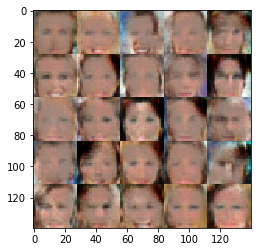

Epoch 4/10... Discriminator Loss: 0.1486... Generator Loss: 2.4016
Epoch 4/10... Discriminator Loss: 0.0490... Generator Loss: 3.9828
Epoch 4/10... Discriminator Loss: 1.1089... Generator Loss: 1.6397
Epoch 4/10... Discriminator Loss: 0.9882... Generator Loss: 0.7310
Epoch 4/10... Discriminator Loss: 0.8349... Generator Loss: 0.8713
Epoch 4/10... Discriminator Loss: 0.5516... Generator Loss: 1.1623
Epoch 4/10... Discriminator Loss: 0.4099... Generator Loss: 1.9326
Epoch 4/10... Discriminator Loss: 2.3291... Generator Loss: 0.1594
Epoch 4/10... Discriminator Loss: 0.5812... Generator Loss: 1.2119
Epoch 4/10... Discriminator Loss: 0.3730... Generator Loss: 1.7272


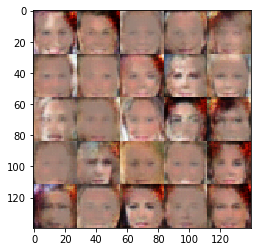

Epoch 4/10... Discriminator Loss: 1.3285... Generator Loss: 0.4083
Epoch 4/10... Discriminator Loss: 0.8310... Generator Loss: 0.7836
Epoch 4/10... Discriminator Loss: 0.2962... Generator Loss: 2.1024
Epoch 4/10... Discriminator Loss: 0.1489... Generator Loss: 2.8512
Epoch 4/10... Discriminator Loss: 0.0941... Generator Loss: 3.1106
Epoch 4/10... Discriminator Loss: 0.0286... Generator Loss: 5.7513
Epoch 4/10... Discriminator Loss: 0.0601... Generator Loss: 4.2237
Epoch 4/10... Discriminator Loss: 0.0779... Generator Loss: 3.2761
Epoch 4/10... Discriminator Loss: 0.1112... Generator Loss: 2.7540
Epoch 4/10... Discriminator Loss: 0.0605... Generator Loss: 3.6493


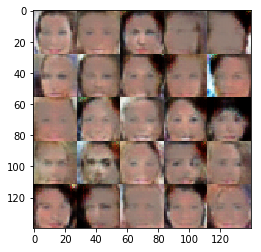

Epoch 4/10... Discriminator Loss: 0.0206... Generator Loss: 6.8625
Epoch 4/10... Discriminator Loss: 0.7234... Generator Loss: 0.7968
Epoch 4/10... Discriminator Loss: 1.1395... Generator Loss: 2.5337
Epoch 4/10... Discriminator Loss: 0.9685... Generator Loss: 2.7573
Epoch 4/10... Discriminator Loss: 0.3318... Generator Loss: 1.9051
Epoch 4/10... Discriminator Loss: 1.5667... Generator Loss: 4.1569
Epoch 4/10... Discriminator Loss: 0.3161... Generator Loss: 1.9717
Epoch 4/10... Discriminator Loss: 0.3550... Generator Loss: 1.6515
Epoch 4/10... Discriminator Loss: 0.0967... Generator Loss: 4.5529
Epoch 4/10... Discriminator Loss: 0.0612... Generator Loss: 4.6402


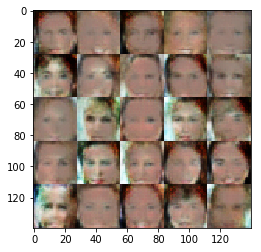

Epoch 4/10... Discriminator Loss: 0.1266... Generator Loss: 2.9363
Epoch 4/10... Discriminator Loss: 0.0210... Generator Loss: 4.9574
Epoch 4/10... Discriminator Loss: 0.2609... Generator Loss: 1.8383
Epoch 4/10... Discriminator Loss: 0.0537... Generator Loss: 4.2271
Epoch 4/10... Discriminator Loss: 0.0658... Generator Loss: 5.9948
Epoch 4/10... Discriminator Loss: 0.4440... Generator Loss: 1.2681
Epoch 4/10... Discriminator Loss: 0.7724... Generator Loss: 1.2947
Epoch 4/10... Discriminator Loss: 0.5437... Generator Loss: 2.0140
Epoch 4/10... Discriminator Loss: 0.4268... Generator Loss: 3.0770
Epoch 4/10... Discriminator Loss: 0.2909... Generator Loss: 2.1510


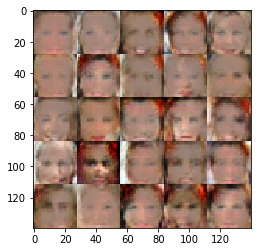

Epoch 4/10... Discriminator Loss: 0.7443... Generator Loss: 0.8071
Epoch 4/10... Discriminator Loss: 0.1746... Generator Loss: 2.6850
Epoch 4/10... Discriminator Loss: 0.1047... Generator Loss: 3.6374
Epoch 4/10... Discriminator Loss: 0.2413... Generator Loss: 2.0523
Epoch 4/10... Discriminator Loss: 0.1157... Generator Loss: 4.9889
Epoch 4/10... Discriminator Loss: 1.2626... Generator Loss: 0.4467
Epoch 4/10... Discriminator Loss: 0.7796... Generator Loss: 0.9608
Epoch 4/10... Discriminator Loss: 0.9639... Generator Loss: 0.6158
Epoch 4/10... Discriminator Loss: 0.3251... Generator Loss: 1.6277
Epoch 4/10... Discriminator Loss: 0.0878... Generator Loss: 3.1279


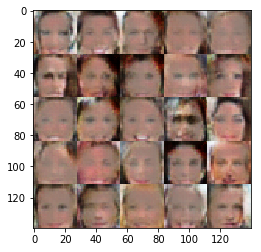

Epoch 4/10... Discriminator Loss: 0.3521... Generator Loss: 1.9264
Epoch 4/10... Discriminator Loss: 1.9897... Generator Loss: 0.2624
Epoch 4/10... Discriminator Loss: 0.5613... Generator Loss: 1.2497
Epoch 4/10... Discriminator Loss: 0.7051... Generator Loss: 0.8540
Epoch 4/10... Discriminator Loss: 3.3790... Generator Loss: 0.0671
Epoch 4/10... Discriminator Loss: 0.1526... Generator Loss: 2.8279
Epoch 4/10... Discriminator Loss: 0.3409... Generator Loss: 1.6470
Epoch 4/10... Discriminator Loss: 0.1203... Generator Loss: 2.9258
Epoch 4/10... Discriminator Loss: 0.7834... Generator Loss: 0.7448
Epoch 4/10... Discriminator Loss: 0.0828... Generator Loss: 3.3729


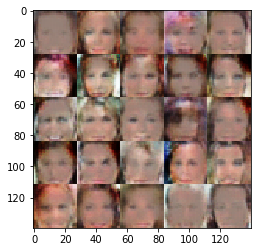

Epoch 4/10... Discriminator Loss: 0.0397... Generator Loss: 5.1005
Epoch 4/10... Discriminator Loss: 0.1006... Generator Loss: 2.9525
Epoch 5/10... Discriminator Loss: 0.0931... Generator Loss: 3.1897
Epoch 5/10... Discriminator Loss: 0.0268... Generator Loss: 7.0354
Epoch 5/10... Discriminator Loss: 0.1031... Generator Loss: 3.0779
Epoch 5/10... Discriminator Loss: 0.0291... Generator Loss: 4.8951
Epoch 5/10... Discriminator Loss: 0.0516... Generator Loss: 4.3461
Epoch 5/10... Discriminator Loss: 0.0187... Generator Loss: 8.3192
Epoch 5/10... Discriminator Loss: 0.0488... Generator Loss: 3.7241
Epoch 5/10... Discriminator Loss: 0.1423... Generator Loss: 2.5238


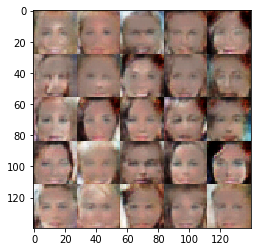

Epoch 5/10... Discriminator Loss: 1.4981... Generator Loss: 0.4012
Epoch 5/10... Discriminator Loss: 0.5502... Generator Loss: 1.8322
Epoch 5/10... Discriminator Loss: 0.4873... Generator Loss: 1.2592
Epoch 5/10... Discriminator Loss: 0.1574... Generator Loss: 2.7852
Epoch 5/10... Discriminator Loss: 0.7520... Generator Loss: 1.0135
Epoch 5/10... Discriminator Loss: 0.5202... Generator Loss: 1.2901
Epoch 5/10... Discriminator Loss: 0.4257... Generator Loss: 1.4796
Epoch 5/10... Discriminator Loss: 0.1555... Generator Loss: 2.5015
Epoch 5/10... Discriminator Loss: 0.2614... Generator Loss: 1.8480
Epoch 5/10... Discriminator Loss: 0.2942... Generator Loss: 1.7808


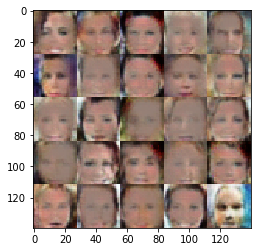

Epoch 5/10... Discriminator Loss: 0.2236... Generator Loss: 2.0217
Epoch 5/10... Discriminator Loss: 0.0939... Generator Loss: 3.1567
Epoch 5/10... Discriminator Loss: 0.0770... Generator Loss: 3.5440
Epoch 5/10... Discriminator Loss: 0.1839... Generator Loss: 2.1868
Epoch 5/10... Discriminator Loss: 0.0483... Generator Loss: 3.9458
Epoch 5/10... Discriminator Loss: 0.0302... Generator Loss: 4.9911
Epoch 5/10... Discriminator Loss: 0.0204... Generator Loss: 4.8698
Epoch 5/10... Discriminator Loss: 0.0493... Generator Loss: 4.7021
Epoch 5/10... Discriminator Loss: 0.4617... Generator Loss: 1.2154
Epoch 5/10... Discriminator Loss: 0.0553... Generator Loss: 3.5527


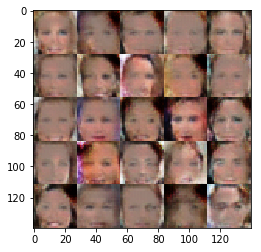

Epoch 5/10... Discriminator Loss: 0.0302... Generator Loss: 4.7008
Epoch 5/10... Discriminator Loss: 0.0559... Generator Loss: 3.6865
Epoch 5/10... Discriminator Loss: 0.0551... Generator Loss: 3.4447
Epoch 5/10... Discriminator Loss: 0.0338... Generator Loss: 5.0954
Epoch 5/10... Discriminator Loss: 0.0271... Generator Loss: 6.1045
Epoch 5/10... Discriminator Loss: 0.0481... Generator Loss: 4.0502
Epoch 5/10... Discriminator Loss: 0.0813... Generator Loss: 3.0680
Epoch 5/10... Discriminator Loss: 0.0460... Generator Loss: 6.6424
Epoch 5/10... Discriminator Loss: 0.0272... Generator Loss: 4.6031
Epoch 5/10... Discriminator Loss: 0.1586... Generator Loss: 3.5283


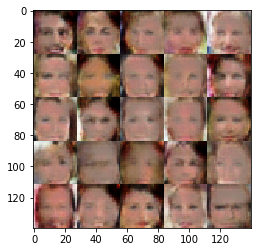

Epoch 5/10... Discriminator Loss: 0.0242... Generator Loss: 4.5758
Epoch 5/10... Discriminator Loss: 0.0641... Generator Loss: 3.4758
Epoch 5/10... Discriminator Loss: 0.2057... Generator Loss: 1.9627
Epoch 5/10... Discriminator Loss: 0.0916... Generator Loss: 2.9428
Epoch 5/10... Discriminator Loss: 0.2327... Generator Loss: 2.0118
Epoch 5/10... Discriminator Loss: 0.8251... Generator Loss: 1.8385
Epoch 5/10... Discriminator Loss: 0.9359... Generator Loss: 0.6881
Epoch 5/10... Discriminator Loss: 0.3870... Generator Loss: 1.7618
Epoch 5/10... Discriminator Loss: 0.3947... Generator Loss: 1.7818
Epoch 5/10... Discriminator Loss: 0.1991... Generator Loss: 2.4813


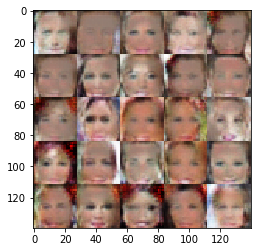

Epoch 5/10... Discriminator Loss: 3.1560... Generator Loss: 0.0694
Epoch 5/10... Discriminator Loss: 0.7828... Generator Loss: 0.8995
Epoch 5/10... Discriminator Loss: 0.9190... Generator Loss: 0.7269
Epoch 5/10... Discriminator Loss: 0.3060... Generator Loss: 1.7277
Epoch 5/10... Discriminator Loss: 0.2808... Generator Loss: 1.7189
Epoch 5/10... Discriminator Loss: 0.1316... Generator Loss: 2.7560
Epoch 5/10... Discriminator Loss: 0.2308... Generator Loss: 2.6914
Epoch 5/10... Discriminator Loss: 1.6671... Generator Loss: 2.7227
Epoch 5/10... Discriminator Loss: 0.7524... Generator Loss: 2.0545
Epoch 5/10... Discriminator Loss: 0.6017... Generator Loss: 3.0335


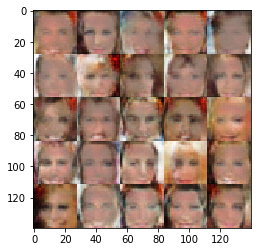

Epoch 5/10... Discriminator Loss: 0.5616... Generator Loss: 1.1249
Epoch 5/10... Discriminator Loss: 0.9043... Generator Loss: 0.6717
Epoch 5/10... Discriminator Loss: 0.8280... Generator Loss: 0.8309
Epoch 5/10... Discriminator Loss: 0.5373... Generator Loss: 1.2777
Epoch 5/10... Discriminator Loss: 0.1015... Generator Loss: 3.2785
Epoch 5/10... Discriminator Loss: 0.3732... Generator Loss: 1.5527
Epoch 5/10... Discriminator Loss: 0.5219... Generator Loss: 1.5002
Epoch 5/10... Discriminator Loss: 0.3044... Generator Loss: 2.0318
Epoch 5/10... Discriminator Loss: 1.9141... Generator Loss: 0.2309
Epoch 5/10... Discriminator Loss: 0.4834... Generator Loss: 1.2217


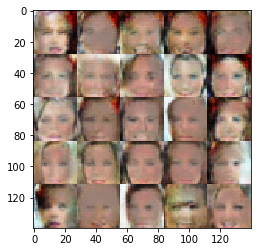

Epoch 5/10... Discriminator Loss: 0.6787... Generator Loss: 0.9052
Epoch 5/10... Discriminator Loss: 0.1717... Generator Loss: 2.5479
Epoch 5/10... Discriminator Loss: 0.3734... Generator Loss: 1.4327
Epoch 5/10... Discriminator Loss: 1.9290... Generator Loss: 5.1516
Epoch 5/10... Discriminator Loss: 0.5511... Generator Loss: 1.5456
Epoch 5/10... Discriminator Loss: 0.8804... Generator Loss: 0.7074
Epoch 5/10... Discriminator Loss: 1.1248... Generator Loss: 0.5555
Epoch 5/10... Discriminator Loss: 0.3780... Generator Loss: 1.6871
Epoch 5/10... Discriminator Loss: 0.3903... Generator Loss: 1.4725
Epoch 5/10... Discriminator Loss: 0.1796... Generator Loss: 2.4301


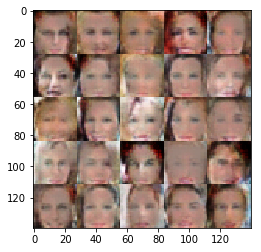

Epoch 5/10... Discriminator Loss: 0.0841... Generator Loss: 3.5455
Epoch 5/10... Discriminator Loss: 0.0506... Generator Loss: 4.2244
Epoch 5/10... Discriminator Loss: 0.1470... Generator Loss: 2.6097
Epoch 5/10... Discriminator Loss: 0.1511... Generator Loss: 2.4527
Epoch 5/10... Discriminator Loss: 0.1763... Generator Loss: 2.2796
Epoch 5/10... Discriminator Loss: 0.1664... Generator Loss: 2.2892
Epoch 5/10... Discriminator Loss: 0.1184... Generator Loss: 2.7892
Epoch 5/10... Discriminator Loss: 0.1188... Generator Loss: 2.8713
Epoch 5/10... Discriminator Loss: 0.0506... Generator Loss: 5.1998
Epoch 5/10... Discriminator Loss: 0.1030... Generator Loss: 3.5225


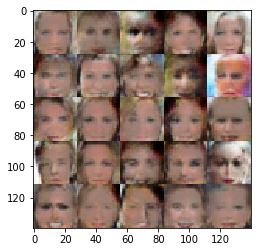

Epoch 5/10... Discriminator Loss: 0.0363... Generator Loss: 4.8113
Epoch 5/10... Discriminator Loss: 0.0471... Generator Loss: 5.9716
Epoch 5/10... Discriminator Loss: 0.0249... Generator Loss: 8.4230
Epoch 5/10... Discriminator Loss: 0.7305... Generator Loss: 0.8501
Epoch 5/10... Discriminator Loss: 0.9010... Generator Loss: 0.7908
Epoch 5/10... Discriminator Loss: 0.4804... Generator Loss: 1.7745
Epoch 5/10... Discriminator Loss: 0.3558... Generator Loss: 1.6681
Epoch 5/10... Discriminator Loss: 0.2871... Generator Loss: 2.2361
Epoch 5/10... Discriminator Loss: 1.1237... Generator Loss: 0.5918
Epoch 5/10... Discriminator Loss: 0.8369... Generator Loss: 0.7494


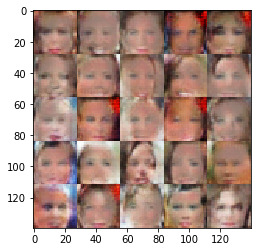

Epoch 5/10... Discriminator Loss: 0.2684... Generator Loss: 1.9237
Epoch 5/10... Discriminator Loss: 0.3731... Generator Loss: 1.5900
Epoch 5/10... Discriminator Loss: 0.0518... Generator Loss: 4.4021
Epoch 5/10... Discriminator Loss: 0.0594... Generator Loss: 3.9160
Epoch 5/10... Discriminator Loss: 0.1182... Generator Loss: 2.8726
Epoch 5/10... Discriminator Loss: 0.1265... Generator Loss: 2.6797
Epoch 5/10... Discriminator Loss: 0.2474... Generator Loss: 1.8765
Epoch 5/10... Discriminator Loss: 0.1129... Generator Loss: 2.8978
Epoch 5/10... Discriminator Loss: 0.1922... Generator Loss: 2.1984
Epoch 5/10... Discriminator Loss: 2.7948... Generator Loss: 4.5863


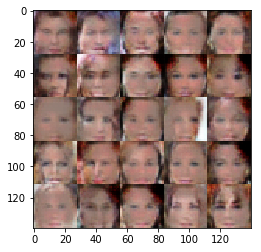

Epoch 5/10... Discriminator Loss: 0.5105... Generator Loss: 1.6292
Epoch 5/10... Discriminator Loss: 0.2075... Generator Loss: 2.0875
Epoch 5/10... Discriminator Loss: 0.8369... Generator Loss: 0.8388
Epoch 5/10... Discriminator Loss: 0.5432... Generator Loss: 1.3948
Epoch 5/10... Discriminator Loss: 0.0857... Generator Loss: 4.0017
Epoch 5/10... Discriminator Loss: 0.1824... Generator Loss: 2.6273
Epoch 5/10... Discriminator Loss: 0.2555... Generator Loss: 1.9745
Epoch 5/10... Discriminator Loss: 0.0441... Generator Loss: 6.1731
Epoch 5/10... Discriminator Loss: 0.1450... Generator Loss: 2.4931
Epoch 5/10... Discriminator Loss: 0.1073... Generator Loss: 2.7860


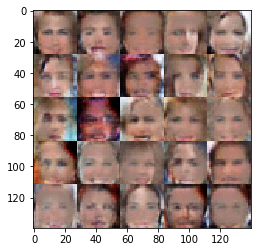

Epoch 5/10... Discriminator Loss: 0.3218... Generator Loss: 1.6620
Epoch 5/10... Discriminator Loss: 0.0826... Generator Loss: 2.9990
Epoch 5/10... Discriminator Loss: 0.2517... Generator Loss: 3.5204
Epoch 5/10... Discriminator Loss: 0.0563... Generator Loss: 3.5399
Epoch 5/10... Discriminator Loss: 4.9613... Generator Loss: 7.4209
Epoch 5/10... Discriminator Loss: 0.6659... Generator Loss: 1.4835
Epoch 5/10... Discriminator Loss: 0.3521... Generator Loss: 1.6870
Epoch 5/10... Discriminator Loss: 0.2265... Generator Loss: 2.3896
Epoch 5/10... Discriminator Loss: 0.1982... Generator Loss: 2.3875
Epoch 5/10... Discriminator Loss: 0.1989... Generator Loss: 2.1280


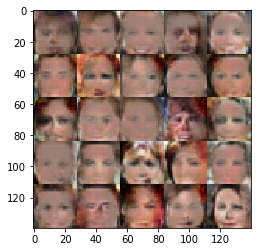

Epoch 5/10... Discriminator Loss: 0.2937... Generator Loss: 1.7654
Epoch 5/10... Discriminator Loss: 0.0706... Generator Loss: 3.3818
Epoch 5/10... Discriminator Loss: 0.0600... Generator Loss: 3.7043
Epoch 5/10... Discriminator Loss: 0.0989... Generator Loss: 2.8433
Epoch 5/10... Discriminator Loss: 0.0371... Generator Loss: 5.6402
Epoch 5/10... Discriminator Loss: 0.1031... Generator Loss: 2.9799
Epoch 5/10... Discriminator Loss: 0.0855... Generator Loss: 3.2002
Epoch 5/10... Discriminator Loss: 1.5500... Generator Loss: 0.4239
Epoch 5/10... Discriminator Loss: 0.7232... Generator Loss: 1.0314
Epoch 5/10... Discriminator Loss: 0.4900... Generator Loss: 2.8633


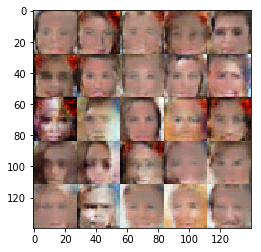

Epoch 5/10... Discriminator Loss: 0.3003... Generator Loss: 2.4792
Epoch 5/10... Discriminator Loss: 0.5930... Generator Loss: 1.3030
Epoch 5/10... Discriminator Loss: 0.3516... Generator Loss: 1.8296
Epoch 5/10... Discriminator Loss: 0.3067... Generator Loss: 2.7649
Epoch 5/10... Discriminator Loss: 0.0859... Generator Loss: 3.9825
Epoch 5/10... Discriminator Loss: 0.1496... Generator Loss: 2.6762
Epoch 5/10... Discriminator Loss: 1.1238... Generator Loss: 0.6271
Epoch 5/10... Discriminator Loss: 1.1074... Generator Loss: 0.5642
Epoch 5/10... Discriminator Loss: 0.3052... Generator Loss: 1.7597
Epoch 5/10... Discriminator Loss: 0.4405... Generator Loss: 1.3352


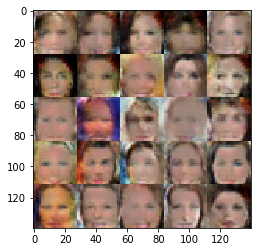

Epoch 5/10... Discriminator Loss: 0.0990... Generator Loss: 3.0274
Epoch 5/10... Discriminator Loss: 0.5106... Generator Loss: 1.1720
Epoch 5/10... Discriminator Loss: 0.0488... Generator Loss: 4.8636
Epoch 5/10... Discriminator Loss: 0.1161... Generator Loss: 4.4033
Epoch 5/10... Discriminator Loss: 0.1185... Generator Loss: 3.0244
Epoch 5/10... Discriminator Loss: 0.0489... Generator Loss: 3.9596
Epoch 5/10... Discriminator Loss: 0.0582... Generator Loss: 4.1420
Epoch 5/10... Discriminator Loss: 0.0687... Generator Loss: 4.6290
Epoch 5/10... Discriminator Loss: 0.0530... Generator Loss: 3.9983
Epoch 5/10... Discriminator Loss: 0.0224... Generator Loss: 5.9702


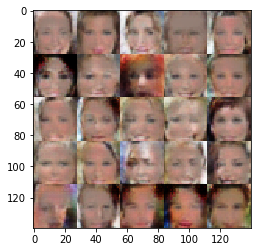

Epoch 5/10... Discriminator Loss: 0.0934... Generator Loss: 3.0850
Epoch 6/10... Discriminator Loss: 0.0305... Generator Loss: 5.2285
Epoch 6/10... Discriminator Loss: 0.1553... Generator Loss: 2.2978
Epoch 6/10... Discriminator Loss: 0.0421... Generator Loss: 5.1639
Epoch 6/10... Discriminator Loss: 0.4062... Generator Loss: 1.3776
Epoch 6/10... Discriminator Loss: 1.0063... Generator Loss: 0.8587
Epoch 6/10... Discriminator Loss: 0.6115... Generator Loss: 1.5262
Epoch 6/10... Discriminator Loss: 0.3804... Generator Loss: 1.8379
Epoch 6/10... Discriminator Loss: 0.4077... Generator Loss: 1.4246
Epoch 6/10... Discriminator Loss: 0.1966... Generator Loss: 2.5012


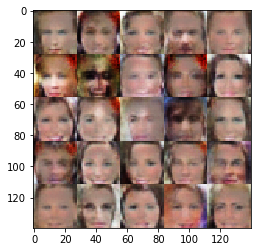

Epoch 6/10... Discriminator Loss: 0.7145... Generator Loss: 4.0123
Epoch 6/10... Discriminator Loss: 1.1529... Generator Loss: 0.9425
Epoch 6/10... Discriminator Loss: 0.5673... Generator Loss: 1.3927
Epoch 6/10... Discriminator Loss: 0.2666... Generator Loss: 1.9481
Epoch 6/10... Discriminator Loss: 0.1629... Generator Loss: 3.5724
Epoch 6/10... Discriminator Loss: 0.5439... Generator Loss: 1.0761
Epoch 6/10... Discriminator Loss: 0.5831... Generator Loss: 1.2538
Epoch 6/10... Discriminator Loss: 1.6236... Generator Loss: 0.3306
Epoch 6/10... Discriminator Loss: 0.2346... Generator Loss: 2.1075
Epoch 6/10... Discriminator Loss: 0.1376... Generator Loss: 2.9842


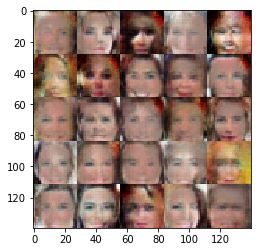

Epoch 6/10... Discriminator Loss: 0.1077... Generator Loss: 2.8748
Epoch 6/10... Discriminator Loss: 0.2380... Generator Loss: 1.9884
Epoch 6/10... Discriminator Loss: 0.6038... Generator Loss: 1.2321
Epoch 6/10... Discriminator Loss: 0.4169... Generator Loss: 1.5411
Epoch 6/10... Discriminator Loss: 0.1777... Generator Loss: 2.9250
Epoch 6/10... Discriminator Loss: 0.2920... Generator Loss: 1.8067
Epoch 6/10... Discriminator Loss: 0.1402... Generator Loss: 2.9973
Epoch 6/10... Discriminator Loss: 0.0601... Generator Loss: 4.2575
Epoch 6/10... Discriminator Loss: 0.0895... Generator Loss: 3.3440
Epoch 6/10... Discriminator Loss: 0.0956... Generator Loss: 3.0795


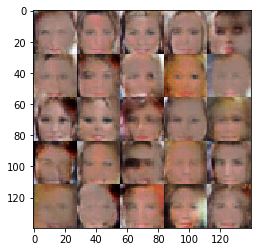

Epoch 6/10... Discriminator Loss: 0.2754... Generator Loss: 1.7392
Epoch 6/10... Discriminator Loss: 0.5013... Generator Loss: 1.1459
Epoch 6/10... Discriminator Loss: 0.8749... Generator Loss: 0.7935
Epoch 6/10... Discriminator Loss: 0.4359... Generator Loss: 1.4178
Epoch 6/10... Discriminator Loss: 0.2536... Generator Loss: 2.6163
Epoch 6/10... Discriminator Loss: 0.0938... Generator Loss: 3.9763
Epoch 6/10... Discriminator Loss: 0.0789... Generator Loss: 3.3319
Epoch 6/10... Discriminator Loss: 0.0904... Generator Loss: 2.9543
Epoch 6/10... Discriminator Loss: 0.1130... Generator Loss: 2.8569
Epoch 6/10... Discriminator Loss: 0.1463... Generator Loss: 2.6831


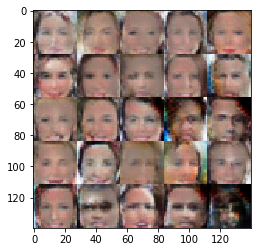

Epoch 6/10... Discriminator Loss: 0.1347... Generator Loss: 2.5473
Epoch 6/10... Discriminator Loss: 0.2490... Generator Loss: 1.8795
Epoch 6/10... Discriminator Loss: 0.2819... Generator Loss: 1.7536
Epoch 6/10... Discriminator Loss: 0.0165... Generator Loss: 7.0422
Epoch 6/10... Discriminator Loss: 0.1662... Generator Loss: 2.4567
Epoch 6/10... Discriminator Loss: 0.0142... Generator Loss: 8.0657
Epoch 6/10... Discriminator Loss: 0.0825... Generator Loss: 3.6730
Epoch 6/10... Discriminator Loss: 0.0296... Generator Loss: 4.6322
Epoch 6/10... Discriminator Loss: 0.0954... Generator Loss: 3.1129
Epoch 6/10... Discriminator Loss: 0.0846... Generator Loss: 3.0208


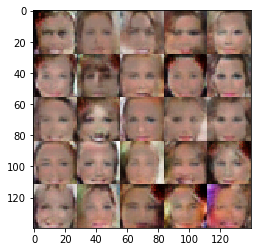

Epoch 6/10... Discriminator Loss: 0.0402... Generator Loss: 4.4734
Epoch 6/10... Discriminator Loss: 0.0397... Generator Loss: 4.1147
Epoch 6/10... Discriminator Loss: 0.0477... Generator Loss: 3.8390
Epoch 6/10... Discriminator Loss: 0.0280... Generator Loss: 4.7788
Epoch 6/10... Discriminator Loss: 0.0528... Generator Loss: 3.4716
Epoch 6/10... Discriminator Loss: 0.0694... Generator Loss: 4.8107
Epoch 6/10... Discriminator Loss: 0.7929... Generator Loss: 2.1994
Epoch 6/10... Discriminator Loss: 0.4697... Generator Loss: 2.3796
Epoch 6/10... Discriminator Loss: 0.5174... Generator Loss: 2.1297
Epoch 6/10... Discriminator Loss: 0.5270... Generator Loss: 1.2417


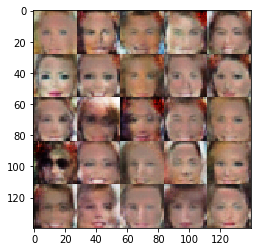

Epoch 6/10... Discriminator Loss: 0.1937... Generator Loss: 2.5104
Epoch 6/10... Discriminator Loss: 0.7537... Generator Loss: 0.8518
Epoch 6/10... Discriminator Loss: 0.3805... Generator Loss: 1.8470
Epoch 6/10... Discriminator Loss: 0.6403... Generator Loss: 1.0390
Epoch 6/10... Discriminator Loss: 0.4553... Generator Loss: 1.5857
Epoch 6/10... Discriminator Loss: 0.2201... Generator Loss: 2.2204
Epoch 6/10... Discriminator Loss: 0.2862... Generator Loss: 1.9363
Epoch 6/10... Discriminator Loss: 0.0809... Generator Loss: 3.4306
Epoch 6/10... Discriminator Loss: 0.3008... Generator Loss: 1.8137
Epoch 6/10... Discriminator Loss: 0.2122... Generator Loss: 2.1924


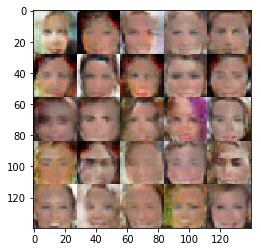

Epoch 6/10... Discriminator Loss: 0.1934... Generator Loss: 2.2294
Epoch 6/10... Discriminator Loss: 0.0712... Generator Loss: 4.4542
Epoch 6/10... Discriminator Loss: 0.7437... Generator Loss: 2.1659
Epoch 6/10... Discriminator Loss: 0.3999... Generator Loss: 1.5750
Epoch 6/10... Discriminator Loss: 0.2070... Generator Loss: 2.2478
Epoch 6/10... Discriminator Loss: 0.0678... Generator Loss: 3.6798
Epoch 6/10... Discriminator Loss: 0.1356... Generator Loss: 2.8466
Epoch 6/10... Discriminator Loss: 0.1226... Generator Loss: 2.7288
Epoch 6/10... Discriminator Loss: 0.0209... Generator Loss: 7.6217
Epoch 6/10... Discriminator Loss: 0.1064... Generator Loss: 2.8224


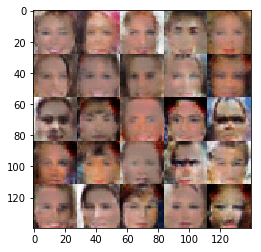

Epoch 6/10... Discriminator Loss: 0.1390... Generator Loss: 2.7948
Epoch 6/10... Discriminator Loss: 0.0641... Generator Loss: 4.2845
Epoch 6/10... Discriminator Loss: 0.0190... Generator Loss: 5.4681
Epoch 6/10... Discriminator Loss: 0.0777... Generator Loss: 3.4484
Epoch 6/10... Discriminator Loss: 0.0767... Generator Loss: 3.2543
Epoch 6/10... Discriminator Loss: 0.0166... Generator Loss: 5.5723
Epoch 6/10... Discriminator Loss: 0.0316... Generator Loss: 5.3551
Epoch 6/10... Discriminator Loss: 0.0863... Generator Loss: 3.2035
Epoch 6/10... Discriminator Loss: 0.0284... Generator Loss: 6.1387
Epoch 6/10... Discriminator Loss: 0.0993... Generator Loss: 2.9356


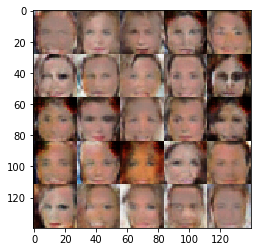

Epoch 6/10... Discriminator Loss: 0.0605... Generator Loss: 3.7163
Epoch 6/10... Discriminator Loss: 0.1310... Generator Loss: 2.6323
Epoch 6/10... Discriminator Loss: 0.0799... Generator Loss: 3.2758
Epoch 6/10... Discriminator Loss: 0.0963... Generator Loss: 2.9414
Epoch 6/10... Discriminator Loss: 0.1205... Generator Loss: 2.6855
Epoch 6/10... Discriminator Loss: 1.4925... Generator Loss: 0.3909
Epoch 6/10... Discriminator Loss: 1.0008... Generator Loss: 0.9496
Epoch 6/10... Discriminator Loss: 0.6618... Generator Loss: 1.3868
Epoch 6/10... Discriminator Loss: 0.3511... Generator Loss: 1.9129
Epoch 6/10... Discriminator Loss: 0.2573... Generator Loss: 2.1006


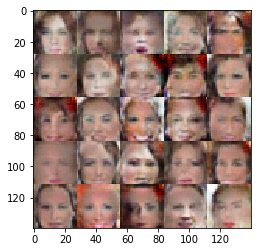

Epoch 6/10... Discriminator Loss: 3.8340... Generator Loss: 5.0488
Epoch 6/10... Discriminator Loss: 0.6451... Generator Loss: 1.1974
Epoch 6/10... Discriminator Loss: 0.3412... Generator Loss: 1.8969
Epoch 6/10... Discriminator Loss: 0.0371... Generator Loss: 5.6887
Epoch 6/10... Discriminator Loss: 0.0377... Generator Loss: 7.2264
Epoch 6/10... Discriminator Loss: 0.3640... Generator Loss: 4.1809
Epoch 6/10... Discriminator Loss: 0.8773... Generator Loss: 0.9857
Epoch 6/10... Discriminator Loss: 0.6100... Generator Loss: 1.7230
Epoch 6/10... Discriminator Loss: 0.2715... Generator Loss: 2.3751
Epoch 6/10... Discriminator Loss: 0.1608... Generator Loss: 2.5917


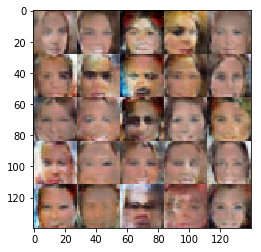

Epoch 6/10... Discriminator Loss: 0.1633... Generator Loss: 2.4935
Epoch 6/10... Discriminator Loss: 0.0462... Generator Loss: 5.4096
Epoch 6/10... Discriminator Loss: 0.1497... Generator Loss: 2.5856
Epoch 6/10... Discriminator Loss: 0.9390... Generator Loss: 0.9210
Epoch 6/10... Discriminator Loss: 0.7178... Generator Loss: 1.2902
Epoch 6/10... Discriminator Loss: 0.7011... Generator Loss: 0.9518
Epoch 6/10... Discriminator Loss: 0.5768... Generator Loss: 2.7157
Epoch 6/10... Discriminator Loss: 0.5518... Generator Loss: 1.7565
Epoch 6/10... Discriminator Loss: 0.2993... Generator Loss: 3.1323
Epoch 6/10... Discriminator Loss: 0.1444... Generator Loss: 2.5199


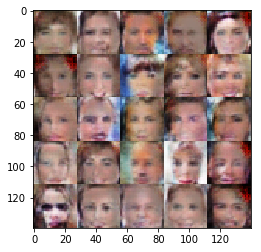

Epoch 6/10... Discriminator Loss: 0.1184... Generator Loss: 2.8859
Epoch 6/10... Discriminator Loss: 0.3407... Generator Loss: 1.4867
Epoch 6/10... Discriminator Loss: 0.1146... Generator Loss: 2.8992
Epoch 6/10... Discriminator Loss: 0.1355... Generator Loss: 3.6078
Epoch 6/10... Discriminator Loss: 0.1242... Generator Loss: 2.9479
Epoch 6/10... Discriminator Loss: 0.0550... Generator Loss: 4.4861
Epoch 6/10... Discriminator Loss: 0.0585... Generator Loss: 3.4647
Epoch 6/10... Discriminator Loss: 0.0517... Generator Loss: 4.0653
Epoch 6/10... Discriminator Loss: 0.2853... Generator Loss: 1.7580
Epoch 6/10... Discriminator Loss: 0.1663... Generator Loss: 2.2572


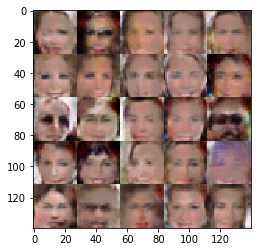

Epoch 6/10... Discriminator Loss: 0.0869... Generator Loss: 3.0687
Epoch 6/10... Discriminator Loss: 1.2320... Generator Loss: 0.4715
Epoch 6/10... Discriminator Loss: 0.7347... Generator Loss: 0.9874
Epoch 6/10... Discriminator Loss: 0.9820... Generator Loss: 4.0674
Epoch 6/10... Discriminator Loss: 0.1863... Generator Loss: 2.6187
Epoch 6/10... Discriminator Loss: 0.2879... Generator Loss: 2.0107
Epoch 6/10... Discriminator Loss: 0.1624... Generator Loss: 3.2783
Epoch 6/10... Discriminator Loss: 0.2495... Generator Loss: 2.3700
Epoch 6/10... Discriminator Loss: 0.2189... Generator Loss: 2.2255
Epoch 6/10... Discriminator Loss: 3.1727... Generator Loss: 5.6210


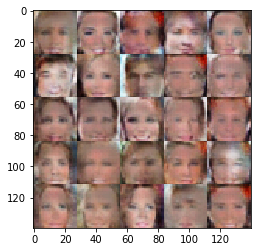

Epoch 6/10... Discriminator Loss: 0.4760... Generator Loss: 1.8078
Epoch 6/10... Discriminator Loss: 0.5083... Generator Loss: 1.1867
Epoch 6/10... Discriminator Loss: 0.2688... Generator Loss: 1.8717
Epoch 6/10... Discriminator Loss: 0.4247... Generator Loss: 1.3335
Epoch 6/10... Discriminator Loss: 0.0407... Generator Loss: 5.0149
Epoch 6/10... Discriminator Loss: 0.0713... Generator Loss: 3.4264
Epoch 6/10... Discriminator Loss: 1.1152... Generator Loss: 1.5449
Epoch 6/10... Discriminator Loss: 0.7272... Generator Loss: 1.4463
Epoch 6/10... Discriminator Loss: 0.9389... Generator Loss: 0.6421
Epoch 6/10... Discriminator Loss: 0.9774... Generator Loss: 0.6439


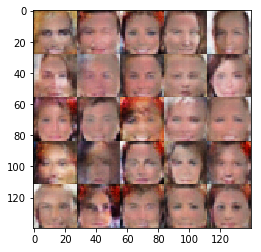

Epoch 6/10... Discriminator Loss: 0.5292... Generator Loss: 1.2389
Epoch 6/10... Discriminator Loss: 0.4913... Generator Loss: 1.6510
Epoch 6/10... Discriminator Loss: 0.4428... Generator Loss: 1.7072
Epoch 6/10... Discriminator Loss: 0.3916... Generator Loss: 1.4938
Epoch 6/10... Discriminator Loss: 0.0460... Generator Loss: 5.0218
Epoch 6/10... Discriminator Loss: 0.3079... Generator Loss: 1.6685
Epoch 6/10... Discriminator Loss: 0.2078... Generator Loss: 2.1864
Epoch 6/10... Discriminator Loss: 0.2062... Generator Loss: 3.1669
Epoch 6/10... Discriminator Loss: 0.1884... Generator Loss: 2.2542
Epoch 7/10... Discriminator Loss: 0.5156... Generator Loss: 1.3086


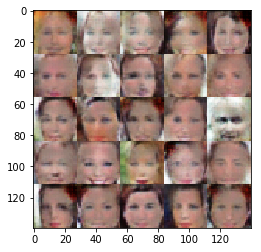

Epoch 7/10... Discriminator Loss: 0.4461... Generator Loss: 1.2768
Epoch 7/10... Discriminator Loss: 0.0359... Generator Loss: 4.8009
Epoch 7/10... Discriminator Loss: 0.0275... Generator Loss: 4.7403
Epoch 7/10... Discriminator Loss: 0.1396... Generator Loss: 2.5333
Epoch 7/10... Discriminator Loss: 0.0327... Generator Loss: 5.6177
Epoch 7/10... Discriminator Loss: 0.1705... Generator Loss: 2.2841
Epoch 7/10... Discriminator Loss: 0.3968... Generator Loss: 1.4281
Epoch 7/10... Discriminator Loss: 0.1868... Generator Loss: 2.1919
Epoch 7/10... Discriminator Loss: 0.1245... Generator Loss: 2.6277
Epoch 7/10... Discriminator Loss: 0.0775... Generator Loss: 3.3768


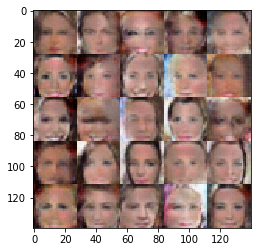

Epoch 7/10... Discriminator Loss: 0.0585... Generator Loss: 3.8277
Epoch 7/10... Discriminator Loss: 0.0457... Generator Loss: 3.7932
Epoch 7/10... Discriminator Loss: 0.1040... Generator Loss: 3.4430
Epoch 7/10... Discriminator Loss: 0.0241... Generator Loss: 5.3505
Epoch 7/10... Discriminator Loss: 2.8121... Generator Loss: 4.8825
Epoch 7/10... Discriminator Loss: 0.4299... Generator Loss: 2.0290
Epoch 7/10... Discriminator Loss: 0.3617... Generator Loss: 1.5420
Epoch 7/10... Discriminator Loss: 0.3916... Generator Loss: 1.5348
Epoch 7/10... Discriminator Loss: 0.2724... Generator Loss: 1.9321
Epoch 7/10... Discriminator Loss: 0.2179... Generator Loss: 2.1733


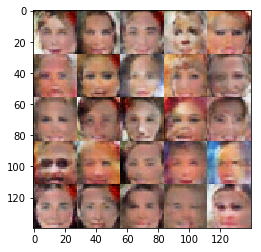

Epoch 7/10... Discriminator Loss: 0.1062... Generator Loss: 3.3009
Epoch 7/10... Discriminator Loss: 1.0141... Generator Loss: 2.6608
Epoch 7/10... Discriminator Loss: 0.3598... Generator Loss: 1.7377
Epoch 7/10... Discriminator Loss: 1.0073... Generator Loss: 0.6166
Epoch 7/10... Discriminator Loss: 0.3773... Generator Loss: 1.5486
Epoch 7/10... Discriminator Loss: 0.2282... Generator Loss: 2.1698
Epoch 7/10... Discriminator Loss: 0.2006... Generator Loss: 2.6183
Epoch 7/10... Discriminator Loss: 0.1718... Generator Loss: 2.4517
Epoch 7/10... Discriminator Loss: 1.3019... Generator Loss: 0.5268
Epoch 7/10... Discriminator Loss: 0.7010... Generator Loss: 0.9391


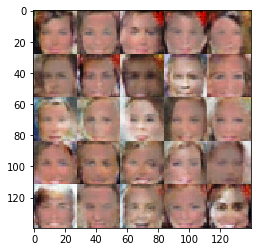

Epoch 7/10... Discriminator Loss: 0.2737... Generator Loss: 2.5865
Epoch 7/10... Discriminator Loss: 0.0284... Generator Loss: 6.2268
Epoch 7/10... Discriminator Loss: 0.1898... Generator Loss: 2.2107
Epoch 7/10... Discriminator Loss: 0.2841... Generator Loss: 2.6358
Epoch 7/10... Discriminator Loss: 0.0401... Generator Loss: 4.3737
Epoch 7/10... Discriminator Loss: 0.0485... Generator Loss: 4.1802
Epoch 7/10... Discriminator Loss: 0.0662... Generator Loss: 4.3108
Epoch 7/10... Discriminator Loss: 0.1819... Generator Loss: 2.2520
Epoch 7/10... Discriminator Loss: 0.1184... Generator Loss: 2.8606
Epoch 7/10... Discriminator Loss: 0.0671... Generator Loss: 3.3289


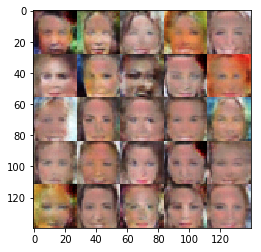

Epoch 7/10... Discriminator Loss: 0.0164... Generator Loss: 5.4577
Epoch 7/10... Discriminator Loss: 0.2357... Generator Loss: 1.9294
Epoch 7/10... Discriminator Loss: 0.1677... Generator Loss: 2.2432
Epoch 7/10... Discriminator Loss: 0.0790... Generator Loss: 3.2419
Epoch 7/10... Discriminator Loss: 0.8078... Generator Loss: 0.7931
Epoch 7/10... Discriminator Loss: 0.2601... Generator Loss: 1.7839
Epoch 7/10... Discriminator Loss: 0.0766... Generator Loss: 3.2446
Epoch 7/10... Discriminator Loss: 0.0457... Generator Loss: 4.1773
Epoch 7/10... Discriminator Loss: 0.0313... Generator Loss: 5.7371
Epoch 7/10... Discriminator Loss: 0.0649... Generator Loss: 3.8926


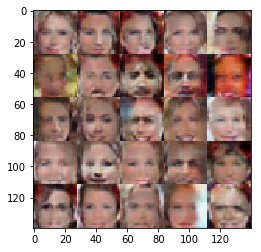

Epoch 7/10... Discriminator Loss: 0.0910... Generator Loss: 3.2958
Epoch 7/10... Discriminator Loss: 0.1136... Generator Loss: 2.7526
Epoch 7/10... Discriminator Loss: 3.0704... Generator Loss: 5.7804
Epoch 7/10... Discriminator Loss: 0.4539... Generator Loss: 1.6974
Epoch 7/10... Discriminator Loss: 0.4162... Generator Loss: 2.2314
Epoch 7/10... Discriminator Loss: 0.1896... Generator Loss: 2.5633
Epoch 7/10... Discriminator Loss: 0.2706... Generator Loss: 1.9656
Epoch 7/10... Discriminator Loss: 0.2094... Generator Loss: 2.3469
Epoch 7/10... Discriminator Loss: 0.1455... Generator Loss: 2.7054
Epoch 7/10... Discriminator Loss: 0.3113... Generator Loss: 1.7653


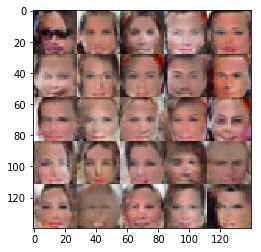

Epoch 7/10... Discriminator Loss: 1.2308... Generator Loss: 4.8864
Epoch 7/10... Discriminator Loss: 0.9906... Generator Loss: 1.8325
Epoch 7/10... Discriminator Loss: 1.2437... Generator Loss: 4.2904
Epoch 7/10... Discriminator Loss: 0.1988... Generator Loss: 2.3813
Epoch 7/10... Discriminator Loss: 0.2623... Generator Loss: 2.3833
Epoch 7/10... Discriminator Loss: 0.9202... Generator Loss: 2.3255
Epoch 7/10... Discriminator Loss: 0.2287... Generator Loss: 2.6674
Epoch 7/10... Discriminator Loss: 0.2124... Generator Loss: 2.2677
Epoch 7/10... Discriminator Loss: 0.1637... Generator Loss: 2.5982
Epoch 7/10... Discriminator Loss: 0.2209... Generator Loss: 2.1334


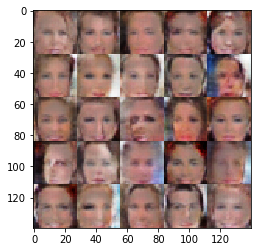

Epoch 7/10... Discriminator Loss: 0.8816... Generator Loss: 2.1154
Epoch 7/10... Discriminator Loss: 0.4329... Generator Loss: 1.7350
Epoch 7/10... Discriminator Loss: 0.0697... Generator Loss: 3.6146
Epoch 7/10... Discriminator Loss: 0.3937... Generator Loss: 1.4987
Epoch 7/10... Discriminator Loss: 0.2461... Generator Loss: 1.9553
Epoch 7/10... Discriminator Loss: 0.1834... Generator Loss: 2.3773
Epoch 7/10... Discriminator Loss: 0.1814... Generator Loss: 2.3076
Epoch 7/10... Discriminator Loss: 0.1100... Generator Loss: 2.9200
Epoch 7/10... Discriminator Loss: 0.2635... Generator Loss: 1.9187
Epoch 7/10... Discriminator Loss: 0.1467... Generator Loss: 2.4543


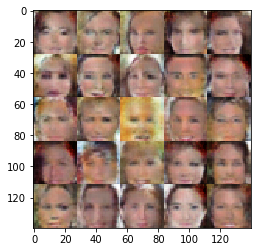

Epoch 7/10... Discriminator Loss: 0.1356... Generator Loss: 2.4827
Epoch 7/10... Discriminator Loss: 0.7588... Generator Loss: 0.8133
Epoch 7/10... Discriminator Loss: 0.5407... Generator Loss: 1.7400
Epoch 7/10... Discriminator Loss: 1.0040... Generator Loss: 0.6479
Epoch 7/10... Discriminator Loss: 0.2168... Generator Loss: 2.1979
Epoch 7/10... Discriminator Loss: 0.4649... Generator Loss: 1.4069
Epoch 7/10... Discriminator Loss: 0.1239... Generator Loss: 2.7147
Epoch 7/10... Discriminator Loss: 0.0622... Generator Loss: 3.4249
Epoch 7/10... Discriminator Loss: 0.2366... Generator Loss: 2.0421
Epoch 7/10... Discriminator Loss: 0.0791... Generator Loss: 3.6075


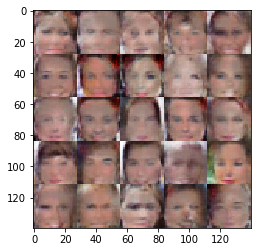

Epoch 7/10... Discriminator Loss: 3.4442... Generator Loss: 4.9430
Epoch 7/10... Discriminator Loss: 0.7008... Generator Loss: 1.3851
Epoch 7/10... Discriminator Loss: 0.2256... Generator Loss: 2.2705
Epoch 7/10... Discriminator Loss: 0.2543... Generator Loss: 5.2632
Epoch 7/10... Discriminator Loss: 0.0933... Generator Loss: 3.3867
Epoch 7/10... Discriminator Loss: 0.1367... Generator Loss: 2.7598
Epoch 7/10... Discriminator Loss: 0.0596... Generator Loss: 3.4978
Epoch 7/10... Discriminator Loss: 0.0463... Generator Loss: 4.2277
Epoch 7/10... Discriminator Loss: 2.6354... Generator Loss: 0.1250
Epoch 7/10... Discriminator Loss: 1.1136... Generator Loss: 0.6977


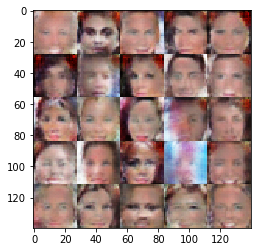

Epoch 7/10... Discriminator Loss: 0.9194... Generator Loss: 0.8020
Epoch 7/10... Discriminator Loss: 0.4755... Generator Loss: 1.3034
Epoch 7/10... Discriminator Loss: 0.4184... Generator Loss: 1.4932
Epoch 7/10... Discriminator Loss: 4.1176... Generator Loss: 0.0666
Epoch 7/10... Discriminator Loss: 1.0669... Generator Loss: 0.6325
Epoch 7/10... Discriminator Loss: 0.5390... Generator Loss: 1.3810
Epoch 7/10... Discriminator Loss: 0.4829... Generator Loss: 1.6381
Epoch 7/10... Discriminator Loss: 0.9201... Generator Loss: 0.6764
Epoch 7/10... Discriminator Loss: 0.6358... Generator Loss: 1.2197
Epoch 7/10... Discriminator Loss: 0.2181... Generator Loss: 2.2068


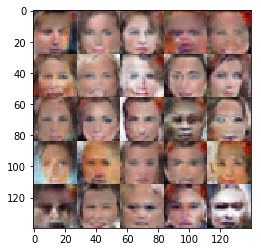

Epoch 7/10... Discriminator Loss: 1.9428... Generator Loss: 5.7244
Epoch 7/10... Discriminator Loss: 0.4822... Generator Loss: 1.7209
Epoch 7/10... Discriminator Loss: 0.2436... Generator Loss: 1.9685
Epoch 7/10... Discriminator Loss: 0.4096... Generator Loss: 1.3754
Epoch 7/10... Discriminator Loss: 0.2522... Generator Loss: 1.9924
Epoch 7/10... Discriminator Loss: 0.2809... Generator Loss: 1.7856
Epoch 7/10... Discriminator Loss: 0.1344... Generator Loss: 2.5111
Epoch 7/10... Discriminator Loss: 0.0716... Generator Loss: 3.6857
Epoch 7/10... Discriminator Loss: 0.1448... Generator Loss: 2.9879
Epoch 7/10... Discriminator Loss: 4.6151... Generator Loss: 7.3350


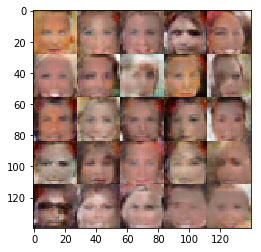

Epoch 7/10... Discriminator Loss: 0.5814... Generator Loss: 1.2768
Epoch 7/10... Discriminator Loss: 0.3489... Generator Loss: 1.8134
Epoch 7/10... Discriminator Loss: 0.4293... Generator Loss: 1.3815
Epoch 7/10... Discriminator Loss: 0.4554... Generator Loss: 1.4330
Epoch 7/10... Discriminator Loss: 0.1105... Generator Loss: 3.7014
Epoch 7/10... Discriminator Loss: 0.2496... Generator Loss: 2.0000
Epoch 7/10... Discriminator Loss: 0.0631... Generator Loss: 3.7209
Epoch 7/10... Discriminator Loss: 0.0864... Generator Loss: 3.2106
Epoch 7/10... Discriminator Loss: 0.1864... Generator Loss: 2.3661
Epoch 7/10... Discriminator Loss: 0.0585... Generator Loss: 3.6199


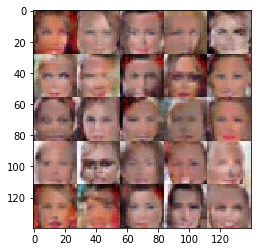

Epoch 7/10... Discriminator Loss: 0.1206... Generator Loss: 2.6600
Epoch 7/10... Discriminator Loss: 0.0819... Generator Loss: 3.2693
Epoch 7/10... Discriminator Loss: 0.0289... Generator Loss: 4.9526
Epoch 7/10... Discriminator Loss: 0.0343... Generator Loss: 4.7536
Epoch 7/10... Discriminator Loss: 0.0225... Generator Loss: 5.0435
Epoch 7/10... Discriminator Loss: 0.2690... Generator Loss: 1.7892
Epoch 7/10... Discriminator Loss: 0.0365... Generator Loss: 3.9532
Epoch 7/10... Discriminator Loss: 0.2412... Generator Loss: 1.9642
Epoch 7/10... Discriminator Loss: 0.0625... Generator Loss: 4.1459
Epoch 7/10... Discriminator Loss: 0.0765... Generator Loss: 3.4143


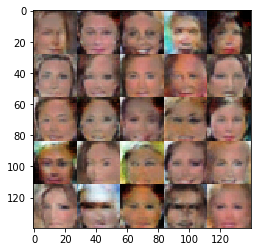

Epoch 7/10... Discriminator Loss: 0.0510... Generator Loss: 3.9055
Epoch 7/10... Discriminator Loss: 0.0856... Generator Loss: 3.2625
Epoch 7/10... Discriminator Loss: 0.0679... Generator Loss: 3.6335
Epoch 7/10... Discriminator Loss: 0.0561... Generator Loss: 3.7869
Epoch 7/10... Discriminator Loss: 4.8949... Generator Loss: 8.9209
Epoch 7/10... Discriminator Loss: 0.5527... Generator Loss: 2.1802
Epoch 7/10... Discriminator Loss: 0.2883... Generator Loss: 2.0616
Epoch 7/10... Discriminator Loss: 0.0760... Generator Loss: 3.7053
Epoch 7/10... Discriminator Loss: 0.2577... Generator Loss: 1.9830
Epoch 7/10... Discriminator Loss: 0.2654... Generator Loss: 1.9381


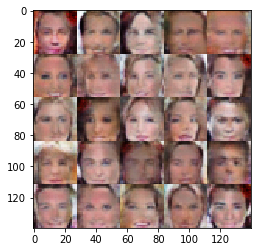

Epoch 7/10... Discriminator Loss: 0.0765... Generator Loss: 3.2168
Epoch 7/10... Discriminator Loss: 0.2498... Generator Loss: 1.9076
Epoch 7/10... Discriminator Loss: 0.0239... Generator Loss: 5.4732
Epoch 7/10... Discriminator Loss: 0.0504... Generator Loss: 4.1619
Epoch 7/10... Discriminator Loss: 0.1241... Generator Loss: 2.5873
Epoch 7/10... Discriminator Loss: 0.2052... Generator Loss: 2.8588
Epoch 7/10... Discriminator Loss: 1.7748... Generator Loss: 1.9740
Epoch 8/10... Discriminator Loss: 1.1188... Generator Loss: 0.5990
Epoch 8/10... Discriminator Loss: 0.3850... Generator Loss: 5.4757
Epoch 8/10... Discriminator Loss: 0.2842... Generator Loss: 1.9395


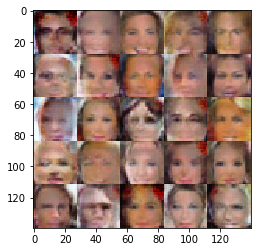

Epoch 8/10... Discriminator Loss: 0.3160... Generator Loss: 1.9129
Epoch 8/10... Discriminator Loss: 0.0584... Generator Loss: 4.3788
Epoch 8/10... Discriminator Loss: 0.0574... Generator Loss: 3.8337
Epoch 8/10... Discriminator Loss: 0.1116... Generator Loss: 2.9765
Epoch 8/10... Discriminator Loss: 0.1252... Generator Loss: 2.9521
Epoch 8/10... Discriminator Loss: 0.0320... Generator Loss: 4.4389
Epoch 8/10... Discriminator Loss: 0.2005... Generator Loss: 2.1447
Epoch 8/10... Discriminator Loss: 0.1535... Generator Loss: 2.3734
Epoch 8/10... Discriminator Loss: 0.0606... Generator Loss: 3.7250
Epoch 8/10... Discriminator Loss: 0.1695... Generator Loss: 2.3329


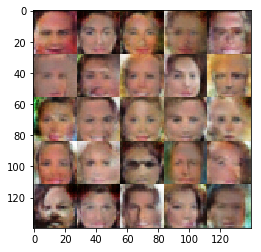

Epoch 8/10... Discriminator Loss: 0.1101... Generator Loss: 2.7845
Epoch 8/10... Discriminator Loss: 0.1105... Generator Loss: 2.7838
Epoch 8/10... Discriminator Loss: 0.5769... Generator Loss: 1.1157
Epoch 8/10... Discriminator Loss: 0.0809... Generator Loss: 3.1111
Epoch 8/10... Discriminator Loss: 0.0394... Generator Loss: 4.2045
Epoch 8/10... Discriminator Loss: 0.5208... Generator Loss: 1.2349
Epoch 8/10... Discriminator Loss: 0.8823... Generator Loss: 0.9904
Epoch 8/10... Discriminator Loss: 0.9404... Generator Loss: 2.9232
Epoch 8/10... Discriminator Loss: 0.7136... Generator Loss: 3.6393
Epoch 8/10... Discriminator Loss: 0.2786... Generator Loss: 2.5181


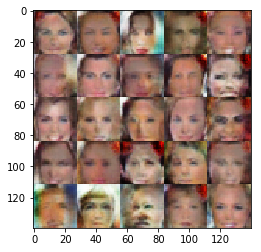

Epoch 8/10... Discriminator Loss: 0.2440... Generator Loss: 2.5198
Epoch 8/10... Discriminator Loss: 0.1995... Generator Loss: 3.3459
Epoch 8/10... Discriminator Loss: 5.6307... Generator Loss: 7.0664
Epoch 8/10... Discriminator Loss: 0.8715... Generator Loss: 1.7274
Epoch 8/10... Discriminator Loss: 0.5382... Generator Loss: 1.3858
Epoch 8/10... Discriminator Loss: 0.6214... Generator Loss: 3.2157
Epoch 8/10... Discriminator Loss: 0.6023... Generator Loss: 2.1341
Epoch 8/10... Discriminator Loss: 0.2459... Generator Loss: 2.0373
Epoch 8/10... Discriminator Loss: 1.7034... Generator Loss: 0.3192
Epoch 8/10... Discriminator Loss: 0.3921... Generator Loss: 1.6325


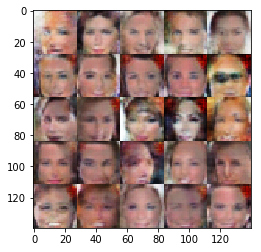

Epoch 8/10... Discriminator Loss: 0.2655... Generator Loss: 1.9176
Epoch 8/10... Discriminator Loss: 0.1490... Generator Loss: 2.5698
Epoch 8/10... Discriminator Loss: 0.0907... Generator Loss: 3.0134
Epoch 8/10... Discriminator Loss: 0.0805... Generator Loss: 3.7176
Epoch 8/10... Discriminator Loss: 0.2464... Generator Loss: 2.0655
Epoch 8/10... Discriminator Loss: 0.6900... Generator Loss: 1.0679
Epoch 8/10... Discriminator Loss: 1.2374... Generator Loss: 0.4745
Epoch 8/10... Discriminator Loss: 0.4614... Generator Loss: 1.3525
Epoch 8/10... Discriminator Loss: 0.4356... Generator Loss: 1.3247
Epoch 8/10... Discriminator Loss: 0.1174... Generator Loss: 2.9992


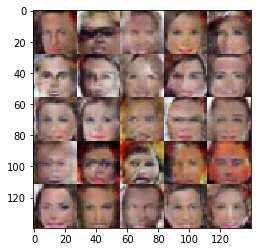

Epoch 8/10... Discriminator Loss: 0.2576... Generator Loss: 1.8876
Epoch 8/10... Discriminator Loss: 0.0519... Generator Loss: 4.3788
Epoch 8/10... Discriminator Loss: 0.1586... Generator Loss: 2.4982
Epoch 8/10... Discriminator Loss: 0.1678... Generator Loss: 2.4100
Epoch 8/10... Discriminator Loss: 0.1111... Generator Loss: 2.8435
Epoch 8/10... Discriminator Loss: 0.0471... Generator Loss: 4.2357
Epoch 8/10... Discriminator Loss: 1.5785... Generator Loss: 0.3717
Epoch 8/10... Discriminator Loss: 0.5528... Generator Loss: 1.1972
Epoch 8/10... Discriminator Loss: 0.2187... Generator Loss: 2.1054
Epoch 8/10... Discriminator Loss: 0.1406... Generator Loss: 2.8738


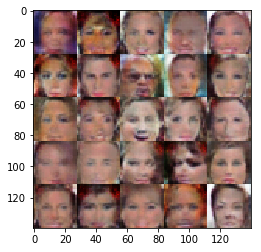

Epoch 8/10... Discriminator Loss: 0.2130... Generator Loss: 2.2169
Epoch 8/10... Discriminator Loss: 0.1616... Generator Loss: 2.5130
Epoch 8/10... Discriminator Loss: 0.0626... Generator Loss: 3.9032
Epoch 8/10... Discriminator Loss: 0.1715... Generator Loss: 3.7864
Epoch 8/10... Discriminator Loss: 0.4944... Generator Loss: 1.7755
Epoch 8/10... Discriminator Loss: 0.5537... Generator Loss: 1.1663
Epoch 8/10... Discriminator Loss: 0.3079... Generator Loss: 3.2269
Epoch 8/10... Discriminator Loss: 0.1276... Generator Loss: 3.1720
Epoch 8/10... Discriminator Loss: 0.2068... Generator Loss: 2.1341
Epoch 8/10... Discriminator Loss: 0.6731... Generator Loss: 4.1885


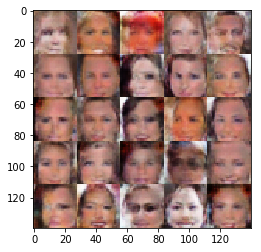

Epoch 8/10... Discriminator Loss: 0.4741... Generator Loss: 2.2930
Epoch 8/10... Discriminator Loss: 0.1628... Generator Loss: 3.4514
Epoch 8/10... Discriminator Loss: 0.5614... Generator Loss: 1.2434
Epoch 8/10... Discriminator Loss: 0.3098... Generator Loss: 1.7432
Epoch 8/10... Discriminator Loss: 0.3754... Generator Loss: 1.4112
Epoch 8/10... Discriminator Loss: 0.2417... Generator Loss: 1.9696
Epoch 8/10... Discriminator Loss: 0.4040... Generator Loss: 1.4955
Epoch 8/10... Discriminator Loss: 0.2012... Generator Loss: 2.1195
Epoch 8/10... Discriminator Loss: 1.5931... Generator Loss: 1.3035
Epoch 8/10... Discriminator Loss: 0.7419... Generator Loss: 1.8409


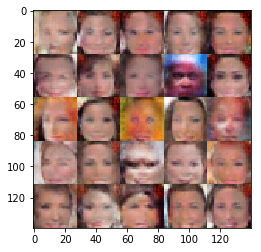

Epoch 8/10... Discriminator Loss: 0.6426... Generator Loss: 1.0695
Epoch 8/10... Discriminator Loss: 0.4226... Generator Loss: 1.3632
Epoch 8/10... Discriminator Loss: 0.6041... Generator Loss: 1.1053
Epoch 8/10... Discriminator Loss: 3.0022... Generator Loss: 0.2413
Epoch 8/10... Discriminator Loss: 0.9625... Generator Loss: 0.7432
Epoch 8/10... Discriminator Loss: 1.1997... Generator Loss: 0.5095
Epoch 8/10... Discriminator Loss: 0.2154... Generator Loss: 2.4533
Epoch 8/10... Discriminator Loss: 0.1565... Generator Loss: 2.9386
Epoch 8/10... Discriminator Loss: 1.5418... Generator Loss: 0.4207
Epoch 8/10... Discriminator Loss: 0.6171... Generator Loss: 1.2570


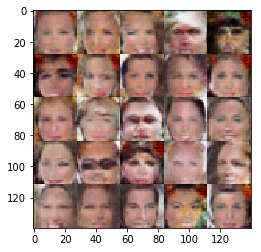

Epoch 8/10... Discriminator Loss: 0.4309... Generator Loss: 1.4763
Epoch 8/10... Discriminator Loss: 0.0805... Generator Loss: 3.4161
Epoch 8/10... Discriminator Loss: 0.1258... Generator Loss: 2.8937
Epoch 8/10... Discriminator Loss: 0.0826... Generator Loss: 3.4747
Epoch 8/10... Discriminator Loss: 0.1426... Generator Loss: 2.6187
Epoch 8/10... Discriminator Loss: 0.1545... Generator Loss: 2.4482
Epoch 8/10... Discriminator Loss: 0.0382... Generator Loss: 4.2811
Epoch 8/10... Discriminator Loss: 0.1544... Generator Loss: 2.5607
Epoch 8/10... Discriminator Loss: 0.1682... Generator Loss: 2.4056
Epoch 8/10... Discriminator Loss: 0.2134... Generator Loss: 2.0454


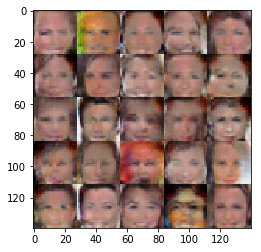

Epoch 8/10... Discriminator Loss: 0.0821... Generator Loss: 3.4346
Epoch 8/10... Discriminator Loss: 0.0323... Generator Loss: 5.3382
Epoch 8/10... Discriminator Loss: 0.0293... Generator Loss: 4.9223
Epoch 8/10... Discriminator Loss: 0.0654... Generator Loss: 3.8274
Epoch 8/10... Discriminator Loss: 0.0805... Generator Loss: 3.2840
Epoch 8/10... Discriminator Loss: 0.3407... Generator Loss: 1.6699
Epoch 8/10... Discriminator Loss: 0.0739... Generator Loss: 3.2608
Epoch 8/10... Discriminator Loss: 0.1648... Generator Loss: 2.3743
Epoch 8/10... Discriminator Loss: 0.1424... Generator Loss: 2.5347
Epoch 8/10... Discriminator Loss: 0.0999... Generator Loss: 2.8972


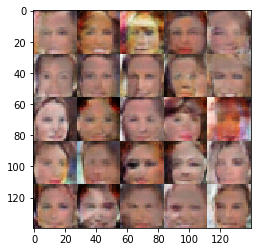

Epoch 8/10... Discriminator Loss: 0.2207... Generator Loss: 2.0451
Epoch 8/10... Discriminator Loss: 0.1842... Generator Loss: 2.2144
Epoch 8/10... Discriminator Loss: 0.0598... Generator Loss: 3.6543
Epoch 8/10... Discriminator Loss: 0.2278... Generator Loss: 2.0258
Epoch 8/10... Discriminator Loss: 0.7528... Generator Loss: 1.9857
Epoch 8/10... Discriminator Loss: 0.5331... Generator Loss: 1.5699
Epoch 8/10... Discriminator Loss: 1.3073... Generator Loss: 0.4559
Epoch 8/10... Discriminator Loss: 0.3088... Generator Loss: 2.3624
Epoch 8/10... Discriminator Loss: 0.2399... Generator Loss: 2.7741
Epoch 8/10... Discriminator Loss: 0.0949... Generator Loss: 3.2115


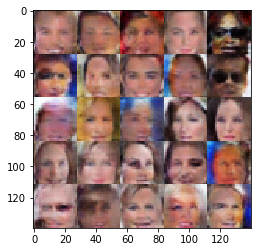

Epoch 8/10... Discriminator Loss: 1.1959... Generator Loss: 2.2213
Epoch 8/10... Discriminator Loss: 0.5624... Generator Loss: 1.6888
Epoch 8/10... Discriminator Loss: 0.2749... Generator Loss: 2.0989
Epoch 8/10... Discriminator Loss: 0.4283... Generator Loss: 1.3817
Epoch 8/10... Discriminator Loss: 0.7429... Generator Loss: 0.8940
Epoch 8/10... Discriminator Loss: 0.6435... Generator Loss: 1.1069
Epoch 8/10... Discriminator Loss: 0.2602... Generator Loss: 2.2635
Epoch 8/10... Discriminator Loss: 0.3172... Generator Loss: 1.7667
Epoch 8/10... Discriminator Loss: 0.2313... Generator Loss: 2.0669
Epoch 8/10... Discriminator Loss: 0.0800... Generator Loss: 3.6001


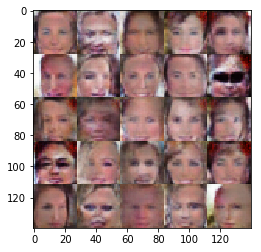

Epoch 8/10... Discriminator Loss: 0.1014... Generator Loss: 3.4394
Epoch 8/10... Discriminator Loss: 0.5068... Generator Loss: 1.1876
Epoch 8/10... Discriminator Loss: 0.3222... Generator Loss: 1.6149
Epoch 8/10... Discriminator Loss: 0.2613... Generator Loss: 1.8177
Epoch 8/10... Discriminator Loss: 0.2159... Generator Loss: 3.0132
Epoch 8/10... Discriminator Loss: 0.0177... Generator Loss: 6.6804
Epoch 8/10... Discriminator Loss: 0.2629... Generator Loss: 1.8070
Epoch 8/10... Discriminator Loss: 0.0798... Generator Loss: 3.2439
Epoch 8/10... Discriminator Loss: 0.4515... Generator Loss: 1.3840
Epoch 8/10... Discriminator Loss: 0.0961... Generator Loss: 2.8448


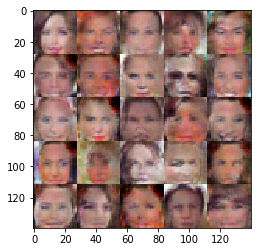

Epoch 8/10... Discriminator Loss: 0.0835... Generator Loss: 3.2204
Epoch 8/10... Discriminator Loss: 0.1978... Generator Loss: 2.1894
Epoch 8/10... Discriminator Loss: 0.0678... Generator Loss: 3.3861
Epoch 8/10... Discriminator Loss: 0.0849... Generator Loss: 3.2683
Epoch 8/10... Discriminator Loss: 0.0956... Generator Loss: 3.1109
Epoch 8/10... Discriminator Loss: 0.3157... Generator Loss: 1.7061
Epoch 8/10... Discriminator Loss: 0.1145... Generator Loss: 2.7216
Epoch 8/10... Discriminator Loss: 0.4656... Generator Loss: 1.2860
Epoch 8/10... Discriminator Loss: 0.0259... Generator Loss: 4.9440
Epoch 8/10... Discriminator Loss: 0.0706... Generator Loss: 3.4189


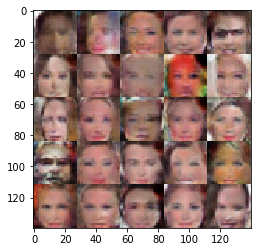

Epoch 8/10... Discriminator Loss: 0.1159... Generator Loss: 2.7950
Epoch 8/10... Discriminator Loss: 0.0806... Generator Loss: 3.0609
Epoch 8/10... Discriminator Loss: 0.5630... Generator Loss: 1.1117
Epoch 8/10... Discriminator Loss: 1.3405... Generator Loss: 0.4810
Epoch 8/10... Discriminator Loss: 0.5835... Generator Loss: 1.5110
Epoch 8/10... Discriminator Loss: 1.3302... Generator Loss: 0.4532
Epoch 8/10... Discriminator Loss: 0.3072... Generator Loss: 2.5026
Epoch 8/10... Discriminator Loss: 0.3763... Generator Loss: 3.2457
Epoch 8/10... Discriminator Loss: 0.2849... Generator Loss: 2.0691
Epoch 8/10... Discriminator Loss: 0.3532... Generator Loss: 2.0972


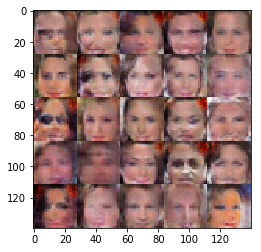

Epoch 8/10... Discriminator Loss: 1.6283... Generator Loss: 0.3472
Epoch 8/10... Discriminator Loss: 0.8875... Generator Loss: 0.7638
Epoch 8/10... Discriminator Loss: 0.2371... Generator Loss: 2.1148
Epoch 8/10... Discriminator Loss: 0.2406... Generator Loss: 1.9932
Epoch 8/10... Discriminator Loss: 0.0648... Generator Loss: 5.8242
Epoch 9/10... Discriminator Loss: 0.3310... Generator Loss: 1.6995
Epoch 9/10... Discriminator Loss: 0.1709... Generator Loss: 2.4134
Epoch 9/10... Discriminator Loss: 0.2176... Generator Loss: 2.0474
Epoch 9/10... Discriminator Loss: 0.0600... Generator Loss: 4.6516
Epoch 9/10... Discriminator Loss: 0.3165... Generator Loss: 1.7034


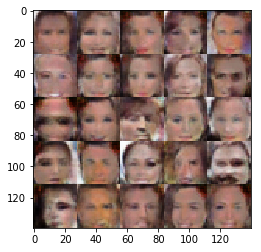

Epoch 9/10... Discriminator Loss: 0.0354... Generator Loss: 5.2963
Epoch 9/10... Discriminator Loss: 0.1880... Generator Loss: 2.2617
Epoch 9/10... Discriminator Loss: 0.1386... Generator Loss: 3.1846
Epoch 9/10... Discriminator Loss: 1.2528... Generator Loss: 0.5237
Epoch 9/10... Discriminator Loss: 0.5545... Generator Loss: 1.3612
Epoch 9/10... Discriminator Loss: 0.4615... Generator Loss: 1.4364
Epoch 9/10... Discriminator Loss: 0.3968... Generator Loss: 1.6227
Epoch 9/10... Discriminator Loss: 1.1496... Generator Loss: 4.3134
Epoch 9/10... Discriminator Loss: 0.3433... Generator Loss: 1.7436
Epoch 9/10... Discriminator Loss: 0.1903... Generator Loss: 2.2745


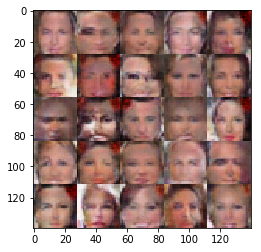

Epoch 9/10... Discriminator Loss: 2.1886... Generator Loss: 0.2496
Epoch 9/10... Discriminator Loss: 0.6160... Generator Loss: 1.3111
Epoch 9/10... Discriminator Loss: 0.3232... Generator Loss: 2.7010
Epoch 9/10... Discriminator Loss: 0.8109... Generator Loss: 0.8516
Epoch 9/10... Discriminator Loss: 0.8220... Generator Loss: 3.1166
Epoch 9/10... Discriminator Loss: 0.4546... Generator Loss: 2.4389
Epoch 9/10... Discriminator Loss: 0.2768... Generator Loss: 2.0692
Epoch 9/10... Discriminator Loss: 0.1890... Generator Loss: 2.2652
Epoch 9/10... Discriminator Loss: 0.1735... Generator Loss: 3.3749
Epoch 9/10... Discriminator Loss: 0.2532... Generator Loss: 1.8462


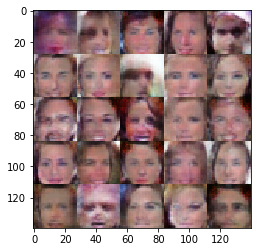

Epoch 9/10... Discriminator Loss: 0.0312... Generator Loss: 4.7303
Epoch 9/10... Discriminator Loss: 0.4165... Generator Loss: 1.3735
Epoch 9/10... Discriminator Loss: 0.6459... Generator Loss: 0.9478
Epoch 9/10... Discriminator Loss: 0.2266... Generator Loss: 2.0068
Epoch 9/10... Discriminator Loss: 3.7266... Generator Loss: 5.0561
Epoch 9/10... Discriminator Loss: 0.5667... Generator Loss: 1.7601
Epoch 9/10... Discriminator Loss: 0.3862... Generator Loss: 1.7163
Epoch 9/10... Discriminator Loss: 0.3904... Generator Loss: 1.6696
Epoch 9/10... Discriminator Loss: 0.6697... Generator Loss: 3.6422
Epoch 9/10... Discriminator Loss: 0.2837... Generator Loss: 2.0349


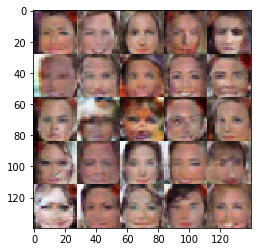

Epoch 9/10... Discriminator Loss: 0.2290... Generator Loss: 2.0439
Epoch 9/10... Discriminator Loss: 0.2678... Generator Loss: 1.9191
Epoch 9/10... Discriminator Loss: 0.4396... Generator Loss: 1.4308
Epoch 9/10... Discriminator Loss: 0.3127... Generator Loss: 1.7129
Epoch 9/10... Discriminator Loss: 0.1483... Generator Loss: 2.5320
Epoch 9/10... Discriminator Loss: 0.1043... Generator Loss: 3.6101
Epoch 9/10... Discriminator Loss: 0.1216... Generator Loss: 2.9184
Epoch 9/10... Discriminator Loss: 0.3227... Generator Loss: 1.6046
Epoch 9/10... Discriminator Loss: 0.1864... Generator Loss: 2.2955
Epoch 9/10... Discriminator Loss: 0.0778... Generator Loss: 3.3466


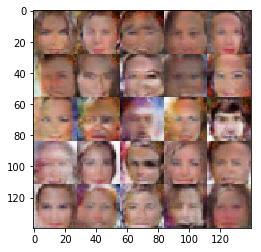

Epoch 9/10... Discriminator Loss: 0.3363... Generator Loss: 1.5807
Epoch 9/10... Discriminator Loss: 0.0259... Generator Loss: 5.5233
Epoch 9/10... Discriminator Loss: 0.2038... Generator Loss: 2.0805
Epoch 9/10... Discriminator Loss: 0.0568... Generator Loss: 3.7918
Epoch 9/10... Discriminator Loss: 2.4950... Generator Loss: 7.4369
Epoch 9/10... Discriminator Loss: 0.6317... Generator Loss: 2.4685
Epoch 9/10... Discriminator Loss: 1.1430... Generator Loss: 0.5744
Epoch 9/10... Discriminator Loss: 0.0977... Generator Loss: 3.4547
Epoch 9/10... Discriminator Loss: 0.2361... Generator Loss: 2.1762
Epoch 9/10... Discriminator Loss: 0.1054... Generator Loss: 2.9119


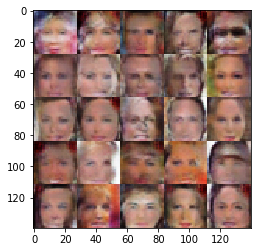

Epoch 9/10... Discriminator Loss: 0.1247... Generator Loss: 3.7052
Epoch 9/10... Discriminator Loss: 0.0468... Generator Loss: 3.6678
Epoch 9/10... Discriminator Loss: 0.0967... Generator Loss: 3.2163
Epoch 9/10... Discriminator Loss: 0.1269... Generator Loss: 3.1537
Epoch 9/10... Discriminator Loss: 0.0765... Generator Loss: 3.6273
Epoch 9/10... Discriminator Loss: 0.0549... Generator Loss: 3.8496
Epoch 9/10... Discriminator Loss: 0.1575... Generator Loss: 2.3285
Epoch 9/10... Discriminator Loss: 0.1579... Generator Loss: 2.3792
Epoch 9/10... Discriminator Loss: 0.0866... Generator Loss: 3.0723
Epoch 9/10... Discriminator Loss: 2.1121... Generator Loss: 3.4986


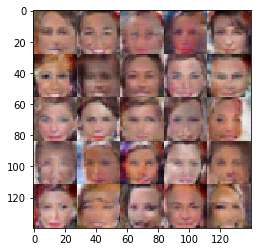

Epoch 9/10... Discriminator Loss: 0.8395... Generator Loss: 1.4041
Epoch 9/10... Discriminator Loss: 0.5090... Generator Loss: 1.8940
Epoch 9/10... Discriminator Loss: 0.5106... Generator Loss: 1.2945
Epoch 9/10... Discriminator Loss: 0.3697... Generator Loss: 1.7163
Epoch 9/10... Discriminator Loss: 1.8635... Generator Loss: 5.3891
Epoch 9/10... Discriminator Loss: 0.5011... Generator Loss: 1.9207
Epoch 9/10... Discriminator Loss: 0.8477... Generator Loss: 3.9028
Epoch 9/10... Discriminator Loss: 0.2175... Generator Loss: 2.7377
Epoch 9/10... Discriminator Loss: 2.3563... Generator Loss: 0.1589
Epoch 9/10... Discriminator Loss: 0.3079... Generator Loss: 2.1887


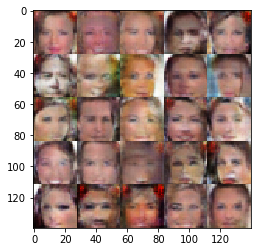

Epoch 9/10... Discriminator Loss: 0.2274... Generator Loss: 2.2260
Epoch 9/10... Discriminator Loss: 0.4690... Generator Loss: 2.3166
Epoch 9/10... Discriminator Loss: 0.3672... Generator Loss: 1.5758
Epoch 9/10... Discriminator Loss: 0.2659... Generator Loss: 1.9158
Epoch 9/10... Discriminator Loss: 0.0693... Generator Loss: 4.3857
Epoch 9/10... Discriminator Loss: 0.0863... Generator Loss: 3.2099
Epoch 9/10... Discriminator Loss: 0.3763... Generator Loss: 1.5031
Epoch 9/10... Discriminator Loss: 0.2558... Generator Loss: 2.3068
Epoch 9/10... Discriminator Loss: 0.1566... Generator Loss: 2.4892
Epoch 9/10... Discriminator Loss: 0.1655... Generator Loss: 2.4204


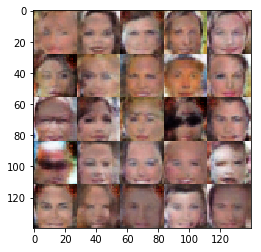

Epoch 9/10... Discriminator Loss: 0.0714... Generator Loss: 3.7789
Epoch 9/10... Discriminator Loss: 0.2986... Generator Loss: 1.6970
Epoch 9/10... Discriminator Loss: 0.1855... Generator Loss: 2.2641
Epoch 9/10... Discriminator Loss: 0.3790... Generator Loss: 1.6006
Epoch 9/10... Discriminator Loss: 0.2621... Generator Loss: 1.9159
Epoch 9/10... Discriminator Loss: 0.1172... Generator Loss: 2.8182
Epoch 9/10... Discriminator Loss: 0.1311... Generator Loss: 2.6551
Epoch 9/10... Discriminator Loss: 0.0327... Generator Loss: 4.1588
Epoch 9/10... Discriminator Loss: 0.0744... Generator Loss: 3.4641
Epoch 9/10... Discriminator Loss: 0.3145... Generator Loss: 1.7462


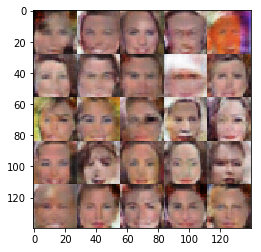

Epoch 9/10... Discriminator Loss: 0.1226... Generator Loss: 2.6401
Epoch 9/10... Discriminator Loss: 0.0543... Generator Loss: 5.4418
Epoch 9/10... Discriminator Loss: 0.0570... Generator Loss: 3.5677
Epoch 9/10... Discriminator Loss: 0.1493... Generator Loss: 2.5663
Epoch 9/10... Discriminator Loss: 0.1874... Generator Loss: 2.2853
Epoch 9/10... Discriminator Loss: 0.0119... Generator Loss: 7.1726
Epoch 9/10... Discriminator Loss: 0.0886... Generator Loss: 3.0298
Epoch 9/10... Discriminator Loss: 0.2149... Generator Loss: 2.1073
Epoch 9/10... Discriminator Loss: 0.0631... Generator Loss: 3.4307
Epoch 9/10... Discriminator Loss: 0.0552... Generator Loss: 3.5405


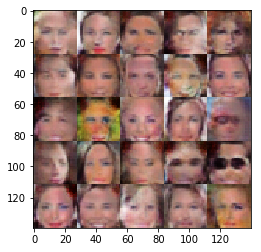

Epoch 9/10... Discriminator Loss: 0.0280... Generator Loss: 5.0156
Epoch 9/10... Discriminator Loss: 0.1205... Generator Loss: 2.7978
Epoch 9/10... Discriminator Loss: 1.5470... Generator Loss: 3.0799
Epoch 9/10... Discriminator Loss: 0.4340... Generator Loss: 2.0814
Epoch 9/10... Discriminator Loss: 0.4907... Generator Loss: 1.2725
Epoch 9/10... Discriminator Loss: 0.2499... Generator Loss: 2.0459
Epoch 9/10... Discriminator Loss: 0.4381... Generator Loss: 4.1040
Epoch 9/10... Discriminator Loss: 0.3891... Generator Loss: 2.0655
Epoch 9/10... Discriminator Loss: 0.3166... Generator Loss: 1.9621
Epoch 9/10... Discriminator Loss: 0.1230... Generator Loss: 3.1868


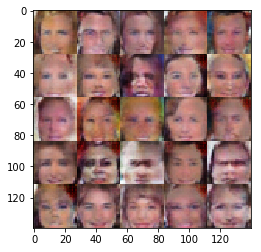

Epoch 9/10... Discriminator Loss: 0.2165... Generator Loss: 2.2645
Epoch 9/10... Discriminator Loss: 0.2701... Generator Loss: 1.9671
Epoch 9/10... Discriminator Loss: 0.8705... Generator Loss: 1.6797
Epoch 9/10... Discriminator Loss: 0.5686... Generator Loss: 1.8061
Epoch 9/10... Discriminator Loss: 0.1935... Generator Loss: 3.0933
Epoch 9/10... Discriminator Loss: 0.5115... Generator Loss: 1.3086
Epoch 9/10... Discriminator Loss: 0.1884... Generator Loss: 2.2568
Epoch 9/10... Discriminator Loss: 0.1661... Generator Loss: 2.6125
Epoch 9/10... Discriminator Loss: 0.2407... Generator Loss: 1.9168
Epoch 9/10... Discriminator Loss: 0.1815... Generator Loss: 2.4360


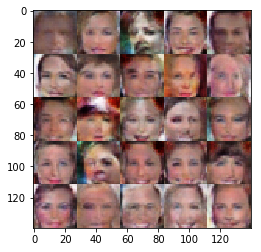

Epoch 9/10... Discriminator Loss: 0.1338... Generator Loss: 2.4490
Epoch 9/10... Discriminator Loss: 0.2629... Generator Loss: 1.9048
Epoch 9/10... Discriminator Loss: 0.1581... Generator Loss: 2.3551
Epoch 9/10... Discriminator Loss: 0.0582... Generator Loss: 3.6546
Epoch 9/10... Discriminator Loss: 0.2347... Generator Loss: 1.9699
Epoch 9/10... Discriminator Loss: 0.2793... Generator Loss: 1.7981
Epoch 9/10... Discriminator Loss: 0.1555... Generator Loss: 2.4261
Epoch 9/10... Discriminator Loss: 2.4378... Generator Loss: 3.6020
Epoch 9/10... Discriminator Loss: 0.8558... Generator Loss: 1.3774
Epoch 9/10... Discriminator Loss: 0.9529... Generator Loss: 3.3607


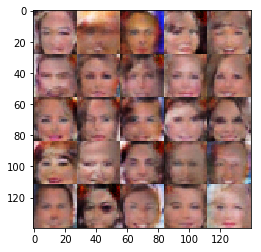

Epoch 9/10... Discriminator Loss: 0.2788... Generator Loss: 2.0363
Epoch 9/10... Discriminator Loss: 1.8840... Generator Loss: 5.2647
Epoch 9/10... Discriminator Loss: 0.4545... Generator Loss: 1.8964
Epoch 9/10... Discriminator Loss: 0.0712... Generator Loss: 3.8895
Epoch 9/10... Discriminator Loss: 0.8438... Generator Loss: 1.7079
Epoch 9/10... Discriminator Loss: 0.5112... Generator Loss: 2.6957
Epoch 9/10... Discriminator Loss: 0.3764... Generator Loss: 1.5906
Epoch 9/10... Discriminator Loss: 0.1173... Generator Loss: 2.9370
Epoch 9/10... Discriminator Loss: 0.3510... Generator Loss: 1.6234
Epoch 9/10... Discriminator Loss: 0.2034... Generator Loss: 2.1762


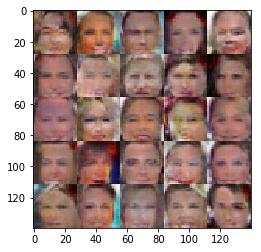

Epoch 9/10... Discriminator Loss: 1.9635... Generator Loss: 4.7441
Epoch 9/10... Discriminator Loss: 0.7340... Generator Loss: 0.9475
Epoch 9/10... Discriminator Loss: 0.3684... Generator Loss: 2.9334
Epoch 9/10... Discriminator Loss: 0.0633... Generator Loss: 3.6810
Epoch 9/10... Discriminator Loss: 0.0612... Generator Loss: 4.6485
Epoch 9/10... Discriminator Loss: 0.1286... Generator Loss: 2.7529
Epoch 9/10... Discriminator Loss: 0.0642... Generator Loss: 3.6694
Epoch 9/10... Discriminator Loss: 0.1680... Generator Loss: 2.5396
Epoch 9/10... Discriminator Loss: 0.1995... Generator Loss: 2.2849
Epoch 9/10... Discriminator Loss: 0.2501... Generator Loss: 1.8998


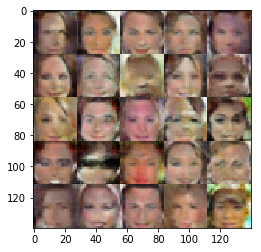

Epoch 9/10... Discriminator Loss: 0.1983... Generator Loss: 2.1508
Epoch 9/10... Discriminator Loss: 0.0748... Generator Loss: 3.3565
Epoch 9/10... Discriminator Loss: 0.2614... Generator Loss: 1.8570
Epoch 10/10... Discriminator Loss: 0.0528... Generator Loss: 3.8450
Epoch 10/10... Discriminator Loss: 0.2929... Generator Loss: 1.7296
Epoch 10/10... Discriminator Loss: 0.2732... Generator Loss: 1.8416
Epoch 10/10... Discriminator Loss: 0.0863... Generator Loss: 3.3498
Epoch 10/10... Discriminator Loss: 0.4039... Generator Loss: 4.3831
Epoch 10/10... Discriminator Loss: 0.4812... Generator Loss: 1.6495
Epoch 10/10... Discriminator Loss: 0.8879... Generator Loss: 3.7962


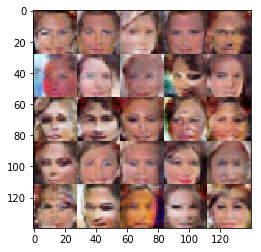

Epoch 10/10... Discriminator Loss: 0.1394... Generator Loss: 3.5897
Epoch 10/10... Discriminator Loss: 0.2265... Generator Loss: 2.4124
Epoch 10/10... Discriminator Loss: 0.3061... Generator Loss: 1.8143
Epoch 10/10... Discriminator Loss: 1.0622... Generator Loss: 3.6810
Epoch 10/10... Discriminator Loss: 0.4586... Generator Loss: 1.9572
Epoch 10/10... Discriminator Loss: 0.2544... Generator Loss: 2.1613
Epoch 10/10... Discriminator Loss: 0.1150... Generator Loss: 3.1657
Epoch 10/10... Discriminator Loss: 0.1541... Generator Loss: 2.4736
Epoch 10/10... Discriminator Loss: 1.3168... Generator Loss: 0.5282
Epoch 10/10... Discriminator Loss: 0.6190... Generator Loss: 1.3994


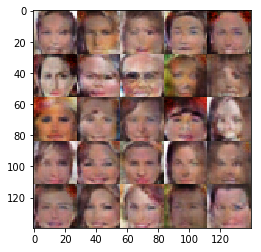

Epoch 10/10... Discriminator Loss: 0.9781... Generator Loss: 0.6618
Epoch 10/10... Discriminator Loss: 0.4587... Generator Loss: 1.5595
Epoch 10/10... Discriminator Loss: 0.2341... Generator Loss: 2.2353
Epoch 10/10... Discriminator Loss: 0.1871... Generator Loss: 2.2589
Epoch 10/10... Discriminator Loss: 0.2952... Generator Loss: 1.8285
Epoch 10/10... Discriminator Loss: 0.1880... Generator Loss: 2.2041
Epoch 10/10... Discriminator Loss: 0.0763... Generator Loss: 3.3809
Epoch 10/10... Discriminator Loss: 0.0564... Generator Loss: 3.8523
Epoch 10/10... Discriminator Loss: 0.0311... Generator Loss: 5.4873
Epoch 10/10... Discriminator Loss: 0.0722... Generator Loss: 3.6623


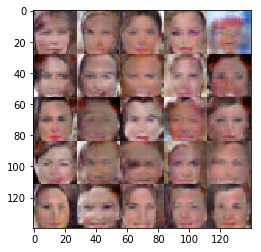

Epoch 10/10... Discriminator Loss: 0.0855... Generator Loss: 3.2807
Epoch 10/10... Discriminator Loss: 0.2889... Generator Loss: 1.7884
Epoch 10/10... Discriminator Loss: 1.6915... Generator Loss: 0.4526
Epoch 10/10... Discriminator Loss: 0.6790... Generator Loss: 1.1598
Epoch 10/10... Discriminator Loss: 0.5358... Generator Loss: 1.6330
Epoch 10/10... Discriminator Loss: 0.5404... Generator Loss: 1.5218
Epoch 10/10... Discriminator Loss: 1.7363... Generator Loss: 0.3399
Epoch 10/10... Discriminator Loss: 0.3709... Generator Loss: 1.7206
Epoch 10/10... Discriminator Loss: 0.2912... Generator Loss: 2.0364
Epoch 10/10... Discriminator Loss: 0.4385... Generator Loss: 1.4420


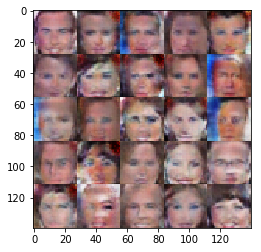

Epoch 10/10... Discriminator Loss: 1.3538... Generator Loss: 2.6740
Epoch 10/10... Discriminator Loss: 0.4706... Generator Loss: 1.3690
Epoch 10/10... Discriminator Loss: 0.2806... Generator Loss: 1.9608
Epoch 10/10... Discriminator Loss: 0.1635... Generator Loss: 2.5917
Epoch 10/10... Discriminator Loss: 1.1434... Generator Loss: 0.5780
Epoch 10/10... Discriminator Loss: 0.7639... Generator Loss: 0.8647
Epoch 10/10... Discriminator Loss: 0.5878... Generator Loss: 3.0767
Epoch 10/10... Discriminator Loss: 0.2148... Generator Loss: 2.2462
Epoch 10/10... Discriminator Loss: 0.3443... Generator Loss: 1.6639
Epoch 10/10... Discriminator Loss: 0.2136... Generator Loss: 2.9808


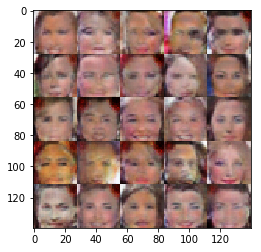

Epoch 10/10... Discriminator Loss: 0.1395... Generator Loss: 3.3674
Epoch 10/10... Discriminator Loss: 1.4239... Generator Loss: 2.2517
Epoch 10/10... Discriminator Loss: 0.5884... Generator Loss: 1.4285
Epoch 10/10... Discriminator Loss: 0.1566... Generator Loss: 3.2011
Epoch 10/10... Discriminator Loss: 0.0580... Generator Loss: 4.3538
Epoch 10/10... Discriminator Loss: 0.5932... Generator Loss: 1.4704
Epoch 10/10... Discriminator Loss: 0.2856... Generator Loss: 2.3382
Epoch 10/10... Discriminator Loss: 0.1625... Generator Loss: 2.5988
Epoch 10/10... Discriminator Loss: 0.2369... Generator Loss: 2.1580
Epoch 10/10... Discriminator Loss: 0.2326... Generator Loss: 2.1956


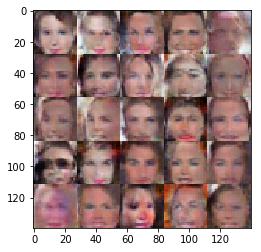

Epoch 10/10... Discriminator Loss: 0.2346... Generator Loss: 1.9622
Epoch 10/10... Discriminator Loss: 2.8991... Generator Loss: 6.1999
Epoch 10/10... Discriminator Loss: 0.4919... Generator Loss: 1.4633
Epoch 10/10... Discriminator Loss: 0.9563... Generator Loss: 0.6802
Epoch 10/10... Discriminator Loss: 0.5135... Generator Loss: 1.2258
Epoch 10/10... Discriminator Loss: 0.3314... Generator Loss: 1.7023
Epoch 10/10... Discriminator Loss: 0.5470... Generator Loss: 1.1597
Epoch 10/10... Discriminator Loss: 0.4483... Generator Loss: 1.3594
Epoch 10/10... Discriminator Loss: 0.2549... Generator Loss: 1.8537
Epoch 10/10... Discriminator Loss: 0.0687... Generator Loss: 4.2292


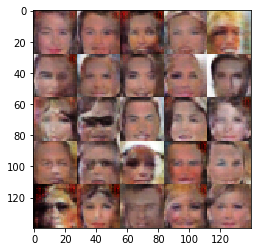

Epoch 10/10... Discriminator Loss: 0.2718... Generator Loss: 1.7968
Epoch 10/10... Discriminator Loss: 0.1411... Generator Loss: 2.6035
Epoch 10/10... Discriminator Loss: 0.0973... Generator Loss: 3.0333
Epoch 10/10... Discriminator Loss: 0.0937... Generator Loss: 3.0991
Epoch 10/10... Discriminator Loss: 2.5133... Generator Loss: 4.9450
Epoch 10/10... Discriminator Loss: 0.5065... Generator Loss: 2.3246
Epoch 10/10... Discriminator Loss: 0.3743... Generator Loss: 1.5955
Epoch 10/10... Discriminator Loss: 0.1939... Generator Loss: 2.6100
Epoch 10/10... Discriminator Loss: 2.1376... Generator Loss: 0.2028
Epoch 10/10... Discriminator Loss: 0.5241... Generator Loss: 1.4031


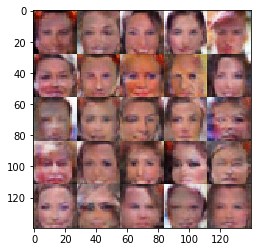

Epoch 10/10... Discriminator Loss: 0.2187... Generator Loss: 2.1005
Epoch 10/10... Discriminator Loss: 0.0934... Generator Loss: 3.0388
Epoch 10/10... Discriminator Loss: 0.1051... Generator Loss: 3.0152
Epoch 10/10... Discriminator Loss: 0.1125... Generator Loss: 3.0010
Epoch 10/10... Discriminator Loss: 0.2645... Generator Loss: 1.9166
Epoch 10/10... Discriminator Loss: 0.1982... Generator Loss: 2.2356
Epoch 10/10... Discriminator Loss: 0.0543... Generator Loss: 4.0331
Epoch 10/10... Discriminator Loss: 0.0945... Generator Loss: 2.8946
Epoch 10/10... Discriminator Loss: 0.1551... Generator Loss: 2.7086
Epoch 10/10... Discriminator Loss: 0.3283... Generator Loss: 1.6471


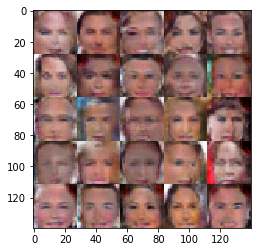

Epoch 10/10... Discriminator Loss: 0.1252... Generator Loss: 2.8779
Epoch 10/10... Discriminator Loss: 0.0211... Generator Loss: 5.3184
Epoch 10/10... Discriminator Loss: 0.1563... Generator Loss: 2.4309
Epoch 10/10... Discriminator Loss: 0.0385... Generator Loss: 4.2702
Epoch 10/10... Discriminator Loss: 0.0521... Generator Loss: 4.1181
Epoch 10/10... Discriminator Loss: 0.3748... Generator Loss: 1.5011
Epoch 10/10... Discriminator Loss: 0.0411... Generator Loss: 4.4573
Epoch 10/10... Discriminator Loss: 0.1887... Generator Loss: 2.2696
Epoch 10/10... Discriminator Loss: 0.2881... Generator Loss: 1.7442
Epoch 10/10... Discriminator Loss: 0.1612... Generator Loss: 2.4904


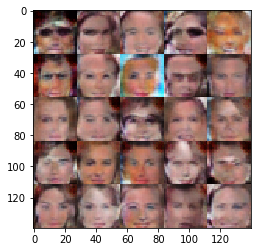

Epoch 10/10... Discriminator Loss: 0.1573... Generator Loss: 2.4763
Epoch 10/10... Discriminator Loss: 0.8005... Generator Loss: 0.8537
Epoch 10/10... Discriminator Loss: 0.6022... Generator Loss: 1.0719
Epoch 10/10... Discriminator Loss: 0.0186... Generator Loss: 5.7448
Epoch 10/10... Discriminator Loss: 0.3137... Generator Loss: 1.7340
Epoch 10/10... Discriminator Loss: 0.0302... Generator Loss: 5.5281
Epoch 10/10... Discriminator Loss: 0.1336... Generator Loss: 2.5999
Epoch 10/10... Discriminator Loss: 0.0199... Generator Loss: 5.9617
Epoch 10/10... Discriminator Loss: 0.0220... Generator Loss: 6.5698
Epoch 10/10... Discriminator Loss: 0.0223... Generator Loss: 5.6480


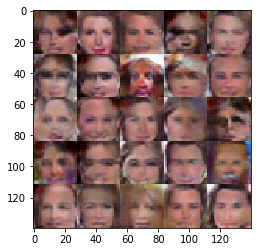

Epoch 10/10... Discriminator Loss: 2.5842... Generator Loss: 3.9570
Epoch 10/10... Discriminator Loss: 0.9902... Generator Loss: 2.6861
Epoch 10/10... Discriminator Loss: 0.5970... Generator Loss: 1.1074
Epoch 10/10... Discriminator Loss: 0.3030... Generator Loss: 2.2451
Epoch 10/10... Discriminator Loss: 1.2625... Generator Loss: 4.1736
Epoch 10/10... Discriminator Loss: 0.3850... Generator Loss: 1.8774
Epoch 10/10... Discriminator Loss: 0.2955... Generator Loss: 2.2096
Epoch 10/10... Discriminator Loss: 4.3411... Generator Loss: 0.0397
Epoch 10/10... Discriminator Loss: 0.5492... Generator Loss: 1.3587
Epoch 10/10... Discriminator Loss: 1.0779... Generator Loss: 0.5932


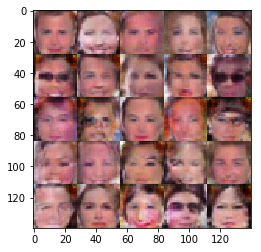

Epoch 10/10... Discriminator Loss: 0.7826... Generator Loss: 0.8629
Epoch 10/10... Discriminator Loss: 0.8519... Generator Loss: 0.8181
Epoch 10/10... Discriminator Loss: 0.0843... Generator Loss: 3.4365
Epoch 10/10... Discriminator Loss: 0.5293... Generator Loss: 1.1809
Epoch 10/10... Discriminator Loss: 0.0558... Generator Loss: 4.2522
Epoch 10/10... Discriminator Loss: 0.0689... Generator Loss: 3.7725
Epoch 10/10... Discriminator Loss: 0.1869... Generator Loss: 2.2982
Epoch 10/10... Discriminator Loss: 0.1763... Generator Loss: 2.3036
Epoch 10/10... Discriminator Loss: 0.1056... Generator Loss: 2.9592
Epoch 10/10... Discriminator Loss: 0.2853... Generator Loss: 1.8714


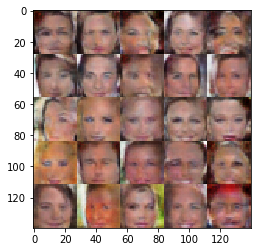

Epoch 10/10... Discriminator Loss: 0.0921... Generator Loss: 3.4212
Epoch 10/10... Discriminator Loss: 0.0296... Generator Loss: 4.7310
Epoch 10/10... Discriminator Loss: 0.1902... Generator Loss: 2.2506
Epoch 10/10... Discriminator Loss: 0.0678... Generator Loss: 3.2519
Epoch 10/10... Discriminator Loss: 0.0587... Generator Loss: 3.6975
Epoch 10/10... Discriminator Loss: 3.8706... Generator Loss: 5.3030
Epoch 10/10... Discriminator Loss: 0.7907... Generator Loss: 1.9777
Epoch 10/10... Discriminator Loss: 0.4342... Generator Loss: 2.7489
Epoch 10/10... Discriminator Loss: 0.6344... Generator Loss: 1.0710
Epoch 10/10... Discriminator Loss: 0.9523... Generator Loss: 0.6752


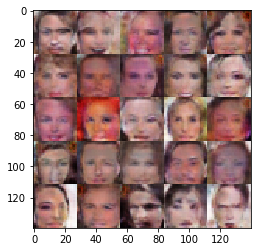

Epoch 10/10... Discriminator Loss: 0.2844... Generator Loss: 2.2752
Epoch 10/10... Discriminator Loss: 0.2084... Generator Loss: 2.6835
Epoch 10/10... Discriminator Loss: 1.9324... Generator Loss: 5.2160
Epoch 10/10... Discriminator Loss: 0.4961... Generator Loss: 1.6763
Epoch 10/10... Discriminator Loss: 0.3044... Generator Loss: 2.3826
Epoch 10/10... Discriminator Loss: 0.2148... Generator Loss: 2.2720
Epoch 10/10... Discriminator Loss: 0.0315... Generator Loss: 6.9883
Epoch 10/10... Discriminator Loss: 0.0574... Generator Loss: 4.3318
Epoch 10/10... Discriminator Loss: 2.0143... Generator Loss: 0.2534
Epoch 10/10... Discriminator Loss: 0.5107... Generator Loss: 1.6639


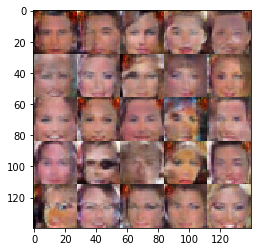

Epoch 10/10... Discriminator Loss: 0.4212... Generator Loss: 1.4033
Epoch 10/10... Discriminator Loss: 0.7312... Generator Loss: 1.1469
Epoch 10/10... Discriminator Loss: 1.1741... Generator Loss: 0.6549
Epoch 10/10... Discriminator Loss: 0.3296... Generator Loss: 1.8571
Epoch 10/10... Discriminator Loss: 0.3050... Generator Loss: 1.8182
Epoch 10/10... Discriminator Loss: 0.1264... Generator Loss: 2.8064
Epoch 10/10... Discriminator Loss: 0.1713... Generator Loss: 2.3789
Epoch 10/10... Discriminator Loss: 0.5273... Generator Loss: 1.2133
Epoch 10/10... Discriminator Loss: 0.4208... Generator Loss: 1.3861
Epoch 10/10... Discriminator Loss: 0.5245... Generator Loss: 1.1674


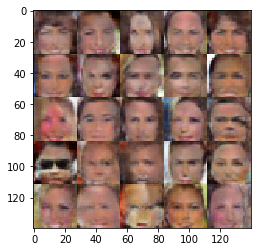

In [ ]:
batch_size = 128
z_dim = 200
learning_rate = 0.0001
beta1 = 0.25


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10 # 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.